<a href="https://colab.research.google.com/github/habibashar786/Cvd-Risk-Prediction/blob/main/CVD_RISK_MLOPS_WITH_A_I_(MODEL_A)_(2)_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [153]:
!pip install xgboost
!pip install graphviz
!pip install shap numpy pandas scikit-learn
!pip install catboost
!pip install lime
!pip install plotly
!pip install tensorflow
!pip install nbconvert[webpdf]
!pip install pandas scikit-learn tensorflow
!pip install torchviz
!pip install graphviz
!pip install torch torchvision torchaudio
!pip install jovian --upgrade --quiet
# !pip install -U kaleido
!pip install fastapi python-multipart uvicorn
!pip install typing-extensions==4.5.0
!pip install --upgrade tensorflow-probability



  Using cached typing_extensions-4.8.0-py3-none-any.whl (31 kB)
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.5.0
    Uninstalling typing_extensions-4.5.0:
      Successfully uninstalled typing_extensions-4.5.0
  Using cached typing_extensions-4.5.0-py3-none-any.whl (27 kB)
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.8.0
    Uninstalling typing_extensions-4.8.0:
      Successfully uninstalled typing_extensions-4.8.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fastapi 0.104.1 requires typing-extensions>=4.8.0, but you have typing-extensions 4.5.0 which is incompatible.


In [154]:
!apt-get update
!apt-get install texlive-xetex texlive-fonts-recommended texlive-plain-generic
!jupyter nbconvert --to pdf "/content/drive/My Drive/CVD Data Set.csv"


Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Fetched 233 kB in 2s (126 kB/s)
Reading package lists... Done
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
texlive-fonts-recommended is already the newest version (2021.20220204-1).
tex

In [155]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler, QuantileTransformer
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.svm import SVR, SVC
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from xgboost import XGBRegressor, XGBClassifier
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, mean_squared_error, r2_score, confusion_matrix, roc_curve, roc_auc_score
import xgboost as xgb
from scipy import stats
from sklearn.decomposition import PCA
import shap
shap.initjs()
import jovian


In [156]:
jovian.commit(project='cvd_risk_mlops_ai')

[jovian] Detected Colab notebook...
[jovian] jovian.commit() is no longer required on Google Colab. If you ran this notebook from Jovian, 
then just save this file in Colab using Ctrl+S/Cmd+S and it will be updated on Jovian. 
Also, you can also delete this cell, it's no longer necessary.


In [157]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [158]:
!ls "/content/drive/My Drive/"


'Colab Notebooks'     fmed-10-1150933.pdf		    Untitled0.ipynb
'CVD Data Set.csv'   'interim report cvd risk.pdf'	    Untitled1.ipynb
 CVIA.2023.0011.pdf  'Survey and General Paper 25_Sep_23'  'Untitled Diagram.drawio'


In [159]:
# Replace 'folder/file.txt' with the actual path to your file within Google Drive
file_path = '/content/drive/My Drive/CVD Data Set.csv'

# Now, you can open and read the file as you would do with a local file
with open(file_path, 'r') as file:
    content = file.read()
    # print(content)
import pandas as pd

# Replace 'your_dataset.csv' with the path to your dataset file in Google Drive
df = pd.read_csv('/content/drive/My Drive/CVD Data Set.csv')



In [160]:
df.head()

,patient_id,age,sex,education,marital_status,occupation,sbp_avg,dbp_avg,bg_mgdl,bmi,smoking,village,areas,cvdrisk,highrisk,bplt,lltt,aptt
0,7.709001e+09,65,Female,primary,married,self-employed,140.5,78.5,156.0,18.90204,nonsmoker,sepanjang,rural,<10%,No,No,No,No
1,7.709001e+09,60,Male,primary,married,self-employed,156.0,108.5,113.0,25.47666,smoker,sepanjang,rural,clinicall high risk,Yes,No,No,No
2,8.005070e+09,87,Male,primary,married,not working,153.5,77.0,91.0,NaN,pastsmoker,majangtengah,rural,20-30%,Yes,No,No,No
3,8.005070e+09,82,Female,primary,married,not working,152.0,76.0,114.0,23.89138,nonsmoker,majangtengah,rural,20-30%,Yes,No,No,No
4,8.005070e+09,55,Female,primary,widowed,casual worker,179.0,94.0,130.0,29.48870,nonsmoker,majangtengah,rural,clinicall high risk,Yes,No,No,No


In [161]:
df.shape

(22093, 18)

In [162]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22093 entries, 0 to 22092
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   patient_id      22093 non-null  float64
 1   age             22093 non-null  int64  
 2   sex             22093 non-null  object 
 3   education       22080 non-null  object 
 4   marital_status  22030 non-null  object 
 5   occupation      22086 non-null  object 
 6   sbp_avg         22010 non-null  float64
 7   dbp_avg         22012 non-null  float64
 8   bg_mgdl         21986 non-null  float64
 9   bmi             21885 non-null  float64
 10  smoking         22093 non-null  object 
 11  village         22093 non-null  object 
 12  areas           22093 non-null  object 
 13  cvdrisk         22091 non-null  object 
 14  highrisk        22093 non-null  object 
 15  bplt            22093 non-null  object 
 16  lltt            22093 non-null  object 
 17  aptt            22093 non-null 

In [163]:
df.describe()

,patient_id,age,sbp_avg,dbp_avg,bg_mgdl,bmi
count,2.209300e+04,22093.000000,22010.000000,22012.000000,21986.000000,21885.000000
mean,5.993599e+11,54.916535,140.390277,88.422679,126.029200,24.984793
std,1.758180e+12,10.787480,23.770916,13.049924,60.497661,4.714012
min,7.709001e+09,40.000000,75.500000,47.000000,40.000000,14.034470
25%,1.020200e+11,46.000000,123.000000,79.500000,94.000000,21.718070
50%,1.030300e+11,53.000000,136.000000,87.000000,110.000000,24.557750
75%,1.040400e+11,61.000000,154.000000,95.500000,133.000000,27.681660
max,9.711270e+12,116.000000,243.000000,190.000000,663.000000,53.624260


In [164]:
df.isnull().sum()

patient_id          0
age                 0
sex                 0
education          13
marital_status     63
occupation          7
sbp_avg            83
dbp_avg            81
bg_mgdl           107
bmi               208
smoking             0
village             0
areas               0
cvdrisk             2
highrisk            0
bplt                0
lltt                0
aptt                0
dtype: int64

In [165]:
df1 = pd.DataFrame(df)

In [166]:
df1.isnull().sum()

patient_id          0
age                 0
sex                 0
education          13
marital_status     63
occupation          7
sbp_avg            83
dbp_avg            81
bg_mgdl           107
bmi               208
smoking             0
village             0
areas               0
cvdrisk             2
highrisk            0
bplt                0
lltt                0
aptt                0
dtype: int64

In [167]:
df_2 = df1.dropna()
df_2.head()

,patient_id,age,sex,education,marital_status,occupation,sbp_avg,dbp_avg,bg_mgdl,bmi,smoking,village,areas,cvdrisk,highrisk,bplt,lltt,aptt
0,7.709001e+09,65,Female,primary,married,self-employed,140.5,78.5,156.0,18.90204,nonsmoker,sepanjang,rural,<10%,No,No,No,No
1,7.709001e+09,60,Male,primary,married,self-employed,156.0,108.5,113.0,25.47666,smoker,sepanjang,rural,clinicall high risk,Yes,No,No,No
3,8.005070e+09,82,Female,primary,married,not working,152.0,76.0,114.0,23.89138,nonsmoker,majangtengah,rural,20-30%,Yes,No,No,No
4,8.005070e+09,55,Female,primary,widowed,casual worker,179.0,94.0,130.0,29.48870,nonsmoker,majangtengah,rural,clinicall high risk,Yes,No,No,No
5,1.011600e+10,100,Male,primary,widowed,not working,191.0,101.0,168.0,20.26936,pastsmoker,sepanjang,rural,clinicall high risk,Yes,No,No,No


In [168]:
df_2.isnull().sum()

patient_id        0
age               0
sex               0
education         0
marital_status    0
occupation        0
sbp_avg           0
dbp_avg           0
bg_mgdl           0
bmi               0
smoking           0
village           0
areas             0
cvdrisk           0
highrisk          0
bplt              0
lltt              0
aptt              0
dtype: int64

In [169]:
b=df_2.shape
b

(21623, 18)

In [170]:
a= df1.shape
a

(22093, 18)

In [171]:
c=a[0]-b[0]
c

470

In [172]:
df_2.duplicated().sum()

1

In [173]:
duplicates = df_2[df_2.duplicated()]
duplicates

,patient_id,age,sex,education,marital_status,occupation,sbp_avg,dbp_avg,bg_mgdl,bmi,smoking,village,areas,cvdrisk,highrisk,bplt,lltt,aptt
16267,1.040400e+11,60,Female,primary,married,not working,135.5,77.5,251.0,25.56611,nonsmoker,kendalpayak,urban,<10%,No,No,No,No


In [174]:
df_no_duplicates = df_2.drop_duplicates()
df_no_duplicates

,patient_id,age,sex,education,marital_status,occupation,sbp_avg,dbp_avg,bg_mgdl,bmi,smoking,village,areas,cvdrisk,highrisk,bplt,lltt,aptt
0,7.709001e+09,65,Female,primary,married,self-employed,140.5,78.5,156.0,18.90204,nonsmoker,sepanjang,rural,<10%,No,No,No,No
1,7.709001e+09,60,Male,primary,married,self-employed,156.0,108.5,113.0,25.47666,smoker,sepanjang,rural,clinicall high risk,Yes,No,No,No
3,8.005070e+09,82,Female,primary,married,not working,152.0,76.0,114.0,23.89138,nonsmoker,majangtengah,rural,20-30%,Yes,No,No,No
4,8.005070e+09,55,Female,primary,widowed,casual worker,179.0,94.0,130.0,29.48870,nonsmoker,majangtengah,rural,clinicall high risk,Yes,No,No,No
5,1.011600e+10,100,Male,primary,widowed,not working,191.0,101.0,168.0,20.26936,pastsmoker,sepanjang,rural,clinicall high risk,Yes,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22088,9.710780e+12,40,Female,secondary,married,not working,117.5,80.0,322.0,40.68560,nonsmoker,kendalpayak,urban,<10%,No,No,No,No
22089,9.711250e+12,65,Female,primary,widowed,not working,141.0,97.0,111.0,26.66667,nonsmoker,kendalpayak,urban,<10%,No,No,No,No
22090,9.711260e+12,56,Female,primary,married,not working,123.5,81.0,87.0,24.55775,nonsmoker,kendalpayak,urban,<10%,No,No,No,No
22091,9.711270e+12,43,Female,primary,married,self-employed,124.5,95.5,86.0,26.83518,nonsmoker,kendalpayak,urban,<10%,No,No,No,No


In [175]:
df3 = df_no_duplicates.copy()
df3.isnull().sum()

patient_id        0
age               0
sex               0
education         0
marital_status    0
occupation        0
sbp_avg           0
dbp_avg           0
bg_mgdl           0
bmi               0
smoking           0
village           0
areas             0
cvdrisk           0
highrisk          0
bplt              0
lltt              0
aptt              0
dtype: int64

In [176]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21622 entries, 0 to 22092
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   patient_id      21622 non-null  float64
 1   age             21622 non-null  int64  
 2   sex             21622 non-null  object 
 3   education       21622 non-null  object 
 4   marital_status  21622 non-null  object 
 5   occupation      21622 non-null  object 
 6   sbp_avg         21622 non-null  float64
 7   dbp_avg         21622 non-null  float64
 8   bg_mgdl         21622 non-null  float64
 9   bmi             21622 non-null  float64
 10  smoking         21622 non-null  object 
 11  village         21622 non-null  object 
 12  areas           21622 non-null  object 
 13  cvdrisk         21622 non-null  object 
 14  highrisk        21622 non-null  object 
 15  bplt            21622 non-null  object 
 16  lltt            21622 non-null  object 
 17  aptt            21622 non-null 

In [177]:
df3['sex'] = df3['sex'].astype('category');
df3['highrisk'] = df3['highrisk'].astype('category');
df3['bplt'] = df3['bplt'].astype('category');
df3['lltt'] = df3['lltt'].astype('category');
df3['aptt'] = df3['aptt'].astype('category');

In [178]:
categorical_Data = df3['sex'].cat.codes
categorical_Data = df3['highrisk'].cat.codes
categorical_Data = df3['bplt'].cat.codes
categorical_Data = df3['lltt'].cat.codes
categorical_Data = df3['aptt'].cat.codes

In [179]:
categorical_Data.head()

0    0
1    0
3    0
4    0
5    0
dtype: int8

In [180]:
df3.describe()

,patient_id,age,sbp_avg,dbp_avg,bg_mgdl,bmi
count,2.162200e+04,21622.000000,21622.000000,21622.000000,21622.000000,21622.000000
mean,6.012693e+11,54.784109,140.329086,88.441079,125.927528,24.971049
std,1.762154e+12,10.693276,23.702971,13.009072,60.432670,4.695728
min,7.709001e+09,40.000000,79.000000,47.000000,40.000000,14.034470
25%,1.020200e+11,46.000000,123.000000,79.500000,94.000000,21.718070
50%,1.030300e+11,53.000000,136.000000,87.000000,110.000000,24.557750
75%,1.040400e+11,61.000000,153.500000,95.500000,133.000000,27.678740
max,9.711270e+12,116.000000,243.000000,190.000000,663.000000,53.624260


In [181]:
numeric_df = df3.select_dtypes(include=['number'])
correlation_matrix = numeric_df.corr()
correlation_matrix

,patient_id,age,sbp_avg,dbp_avg,bg_mgdl,bmi
patient_id,1.000000,0.002407,0.007305,0.009003,-0.001184,0.006653
age,0.002407,1.000000,0.293173,-0.026608,0.065730,-0.238923
sbp_avg,0.007305,0.293173,1.000000,0.765192,0.107343,0.143169
dbp_avg,0.009003,-0.026608,0.765192,1.000000,0.051179,0.268244
bg_mgdl,-0.001184,0.065730,0.107343,0.051179,1.000000,0.096581
bmi,0.006653,-0.238923,0.143169,0.268244,0.096581,1.000000


In [182]:
def map_cvd_risk(value):
    if "<10%" in value or "10-20%" in value:
        return "mild"
    elif "20-30%" in value or "30-40%" in value:
        return "medium"
    elif ">40%" in value or "clinicall high risk" in value or "past history of CVD" in value:
        return "high"
    else:
        return "unknown"

In [183]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21622 entries, 0 to 22092
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   patient_id      21622 non-null  float64 
 1   age             21622 non-null  int64   
 2   sex             21622 non-null  category
 3   education       21622 non-null  object  
 4   marital_status  21622 non-null  object  
 5   occupation      21622 non-null  object  
 6   sbp_avg         21622 non-null  float64 
 7   dbp_avg         21622 non-null  float64 
 8   bg_mgdl         21622 non-null  float64 
 9   bmi             21622 non-null  float64 
 10  smoking         21622 non-null  object  
 11  village         21622 non-null  object  
 12  areas           21622 non-null  object  
 13  cvdrisk         21622 non-null  object  
 14  highrisk        21622 non-null  category
 15  bplt            21622 non-null  category
 16  lltt            21622 non-null  category
 17  aptt        

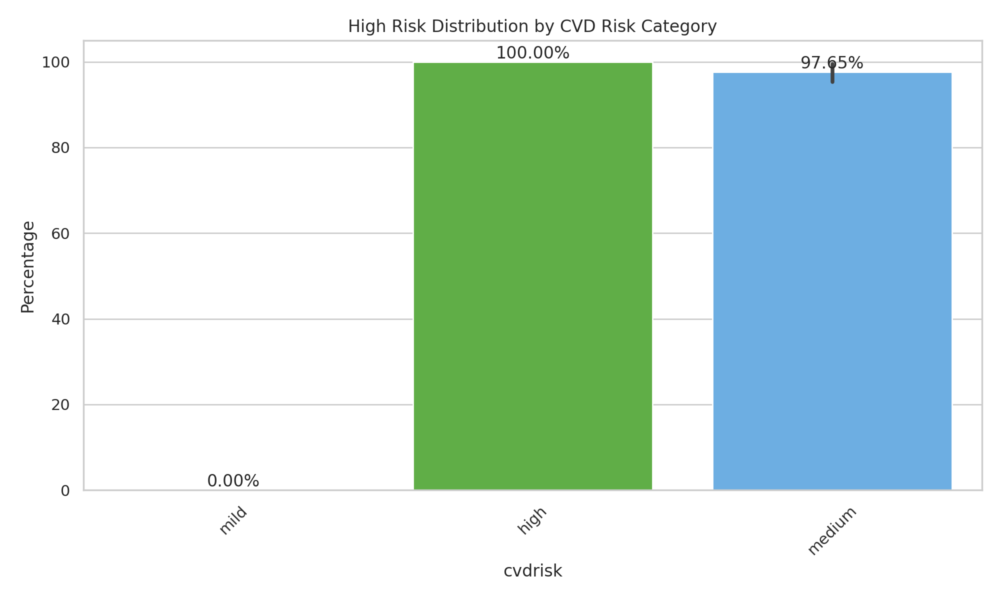

In [184]:
risk_df = df3[['cvdrisk', 'highrisk']]
risk_df['cvdrisk'] = df3["cvdrisk"].apply(map_cvd_risk)
risk_df['highrisk'] = df3['highrisk'].cat.codes
cvd_risk_percentages = risk_df.groupby('cvdrisk')['highrisk'].mean() * 100
# risk_df.head()

plt.figure(figsize=(10, 6))
ax = sns.barplot(data=risk_df, x='cvdrisk', y='highrisk', estimator=lambda x: sum(x) / len(x) * 100)
ax.set(ylabel='Percentage')
ax.set_title('High Risk Distribution by CVD Risk Category')
plt.xticks(rotation=45)
plt.tight_layout()

# Annotate the bars with percentage labels
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom')

plt.show()

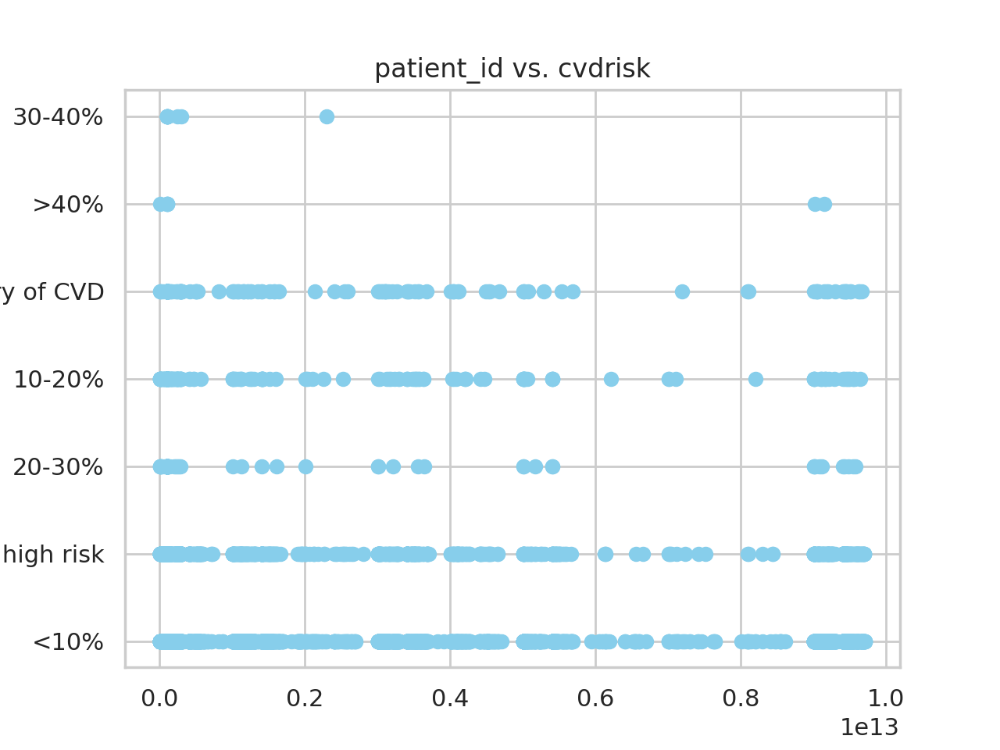

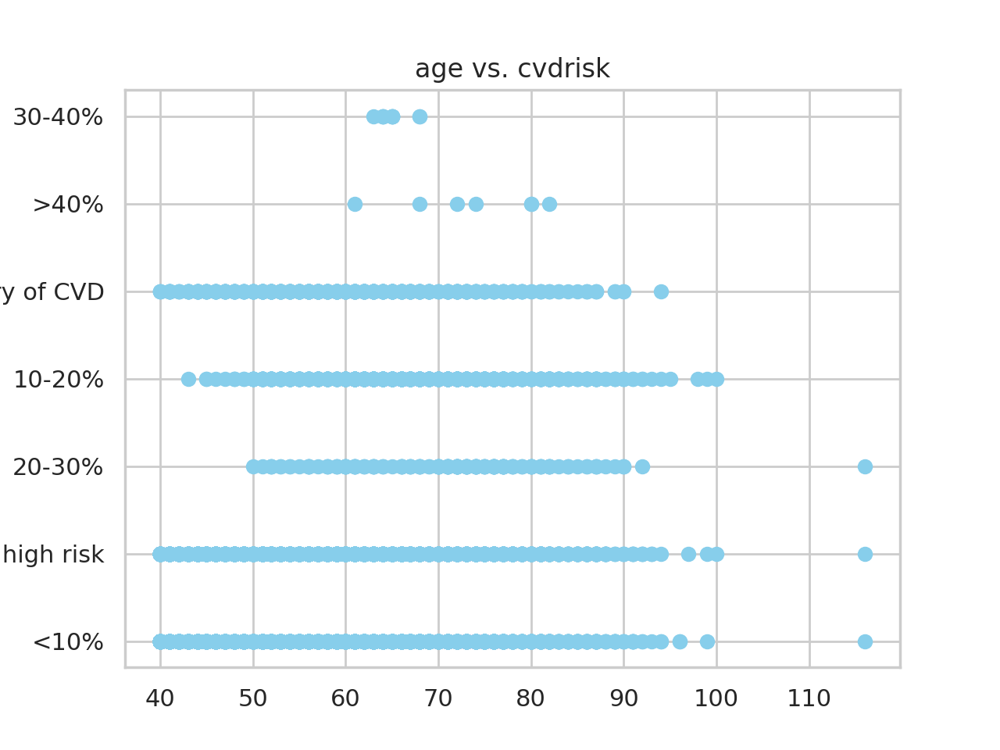

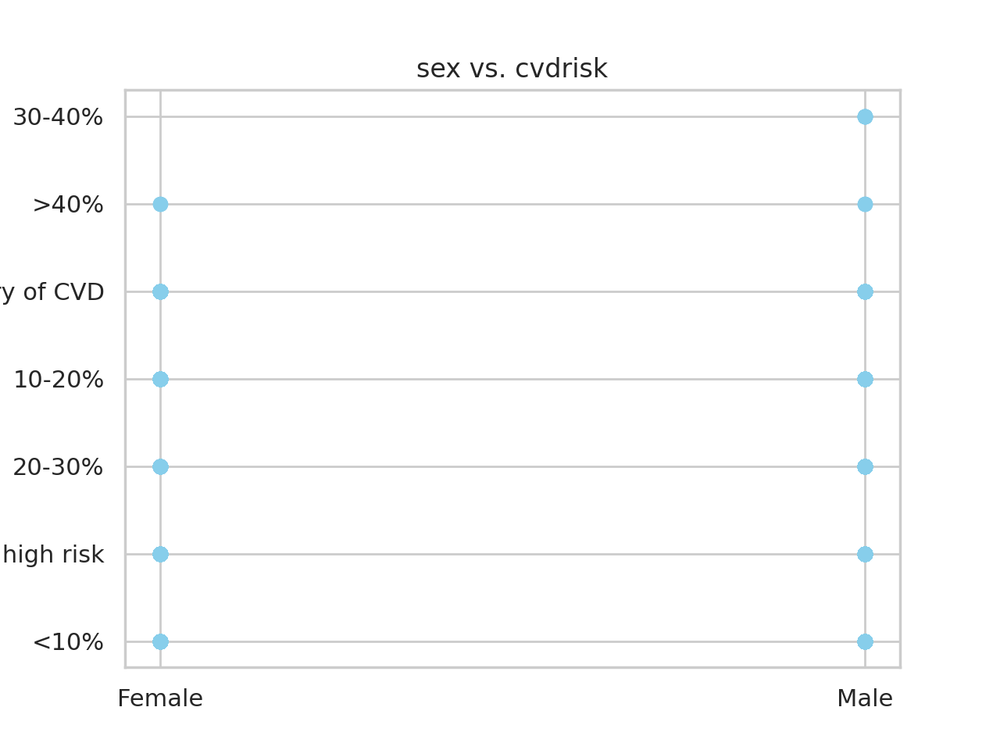

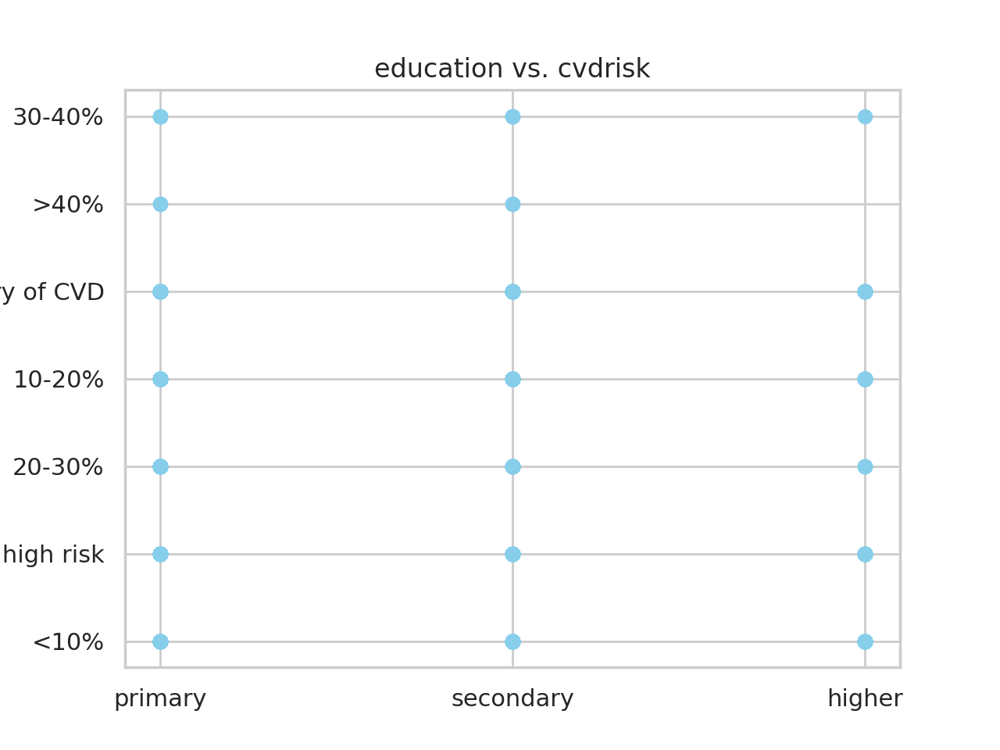

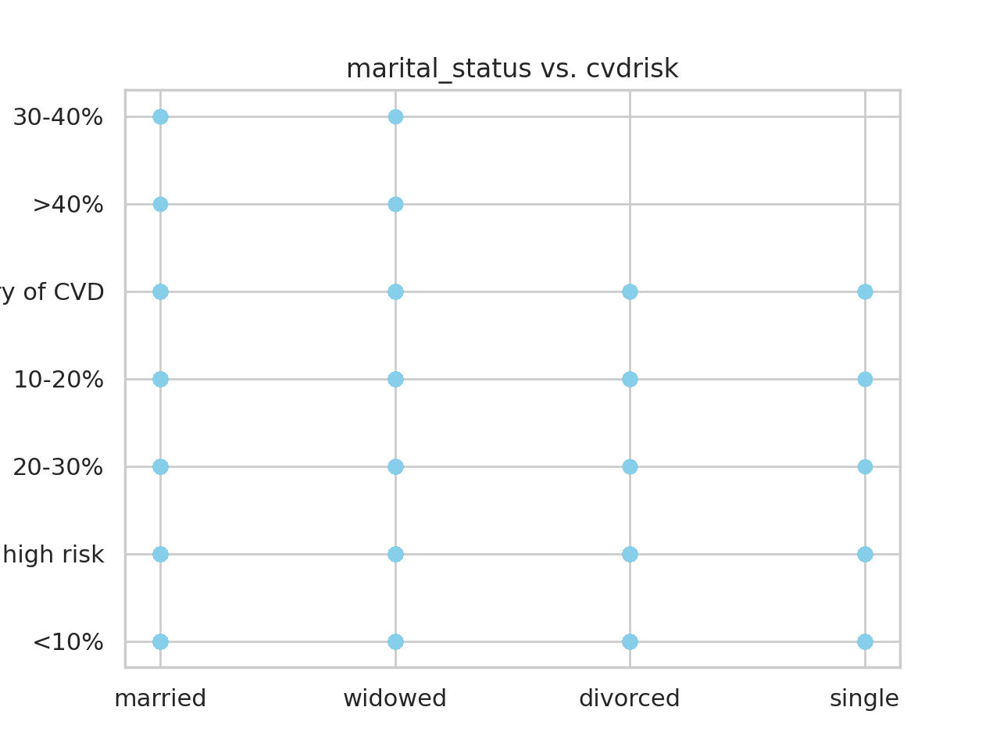

...

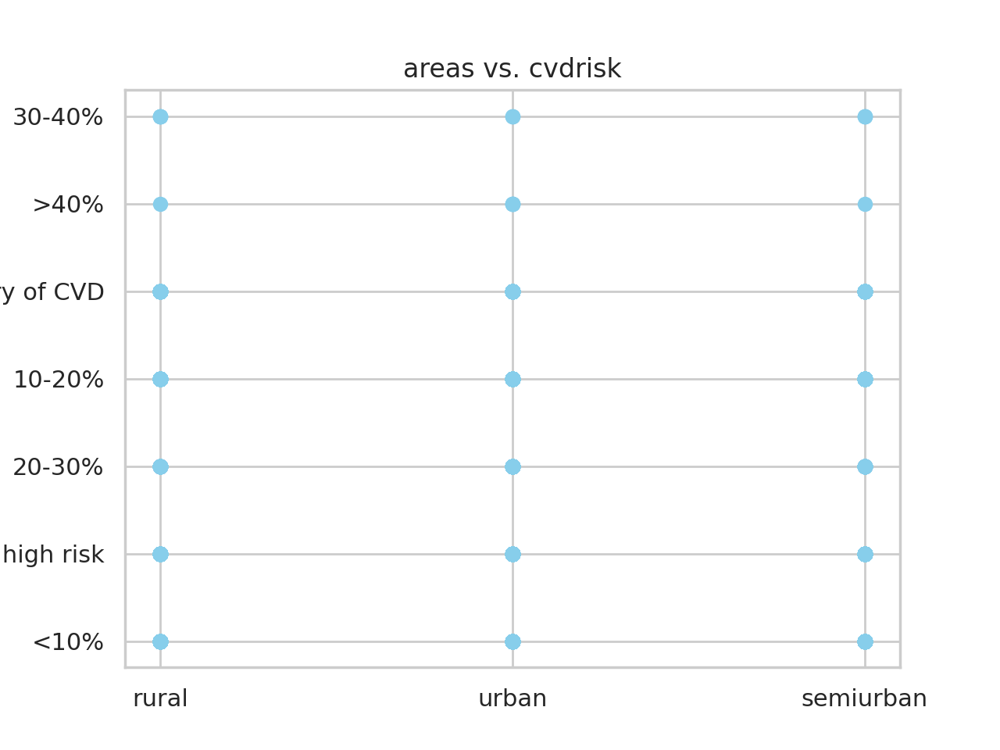

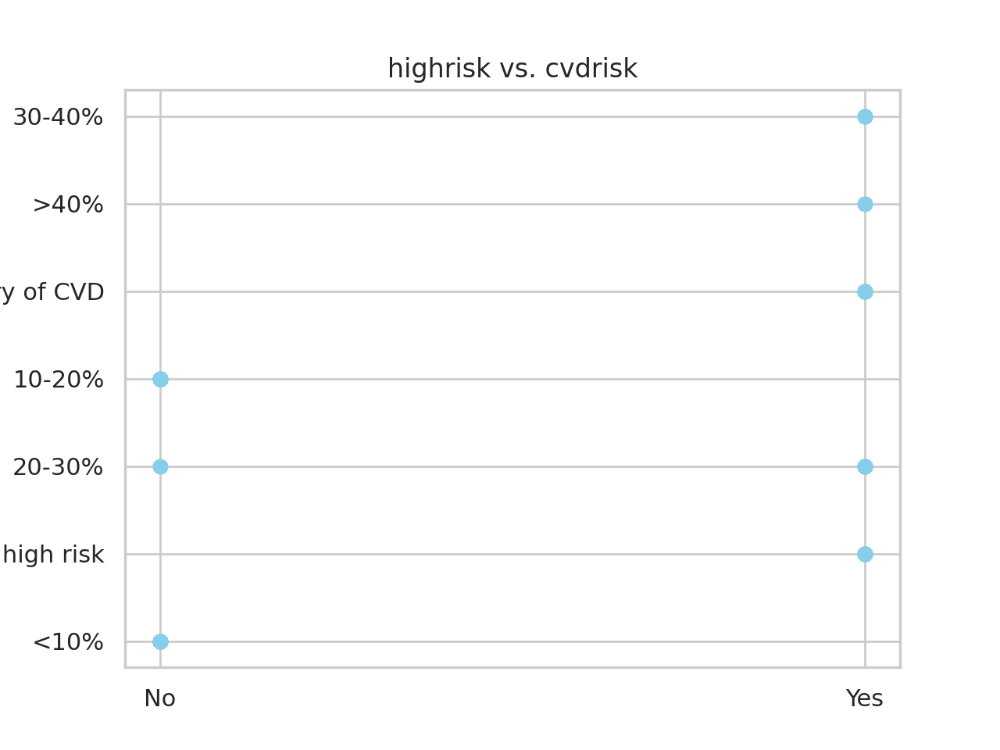

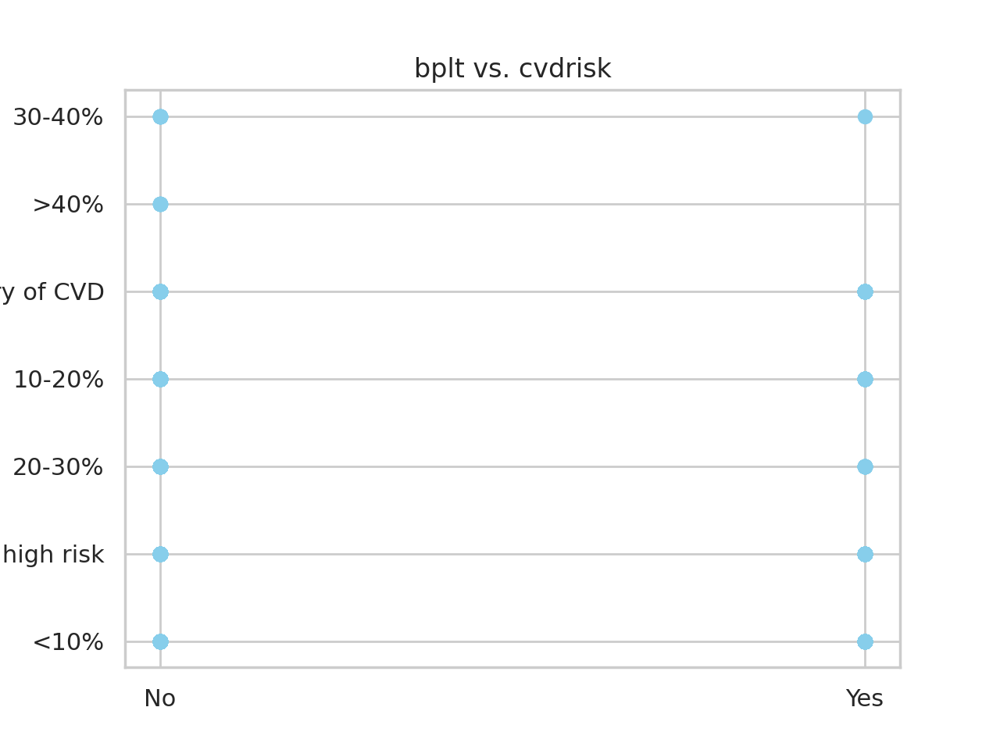

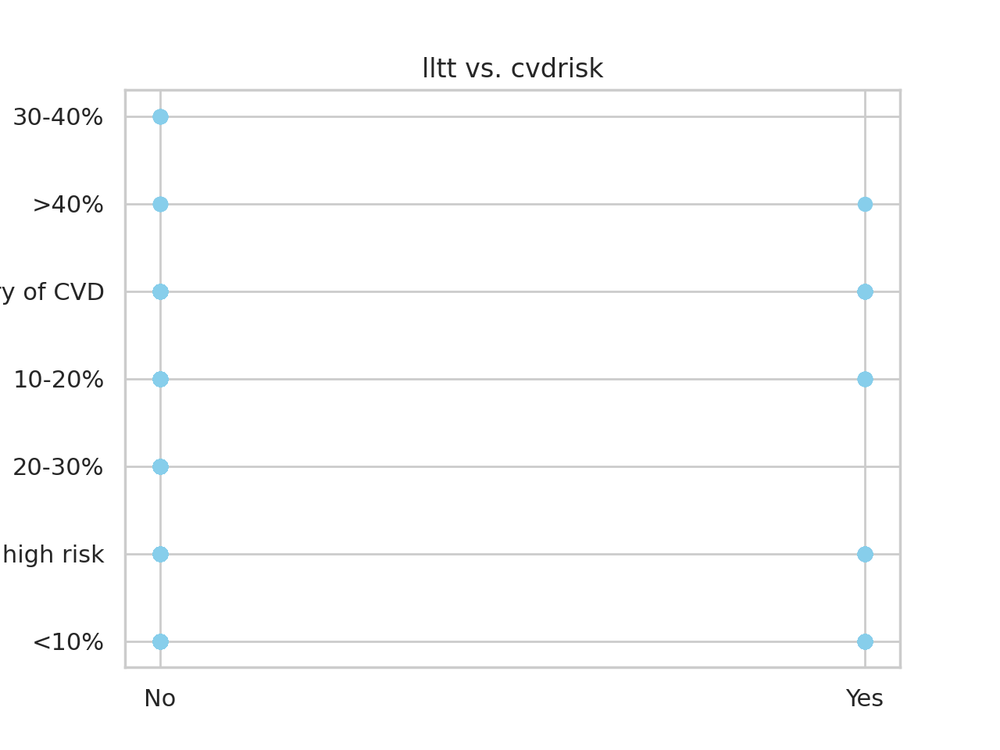

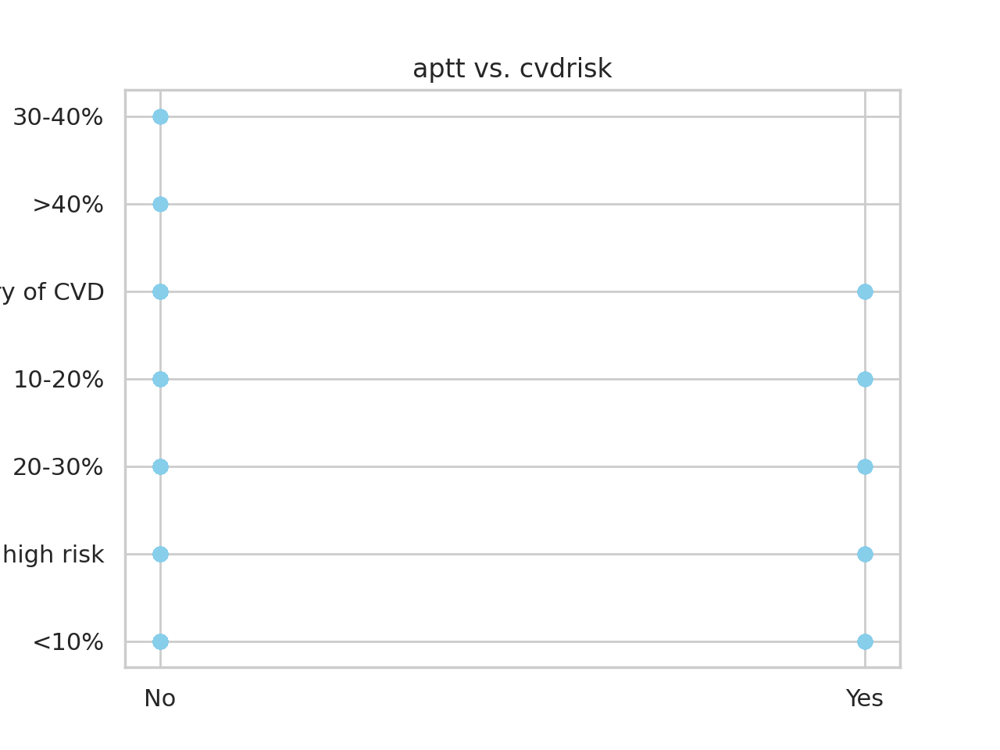

In [185]:
for i in df3.columns:
    if i != "cvdrisk":
        plt.scatter(df3[i], df3["cvdrisk"])
        plt.title(f"{i} vs. cvdrisk")
        plt.show()

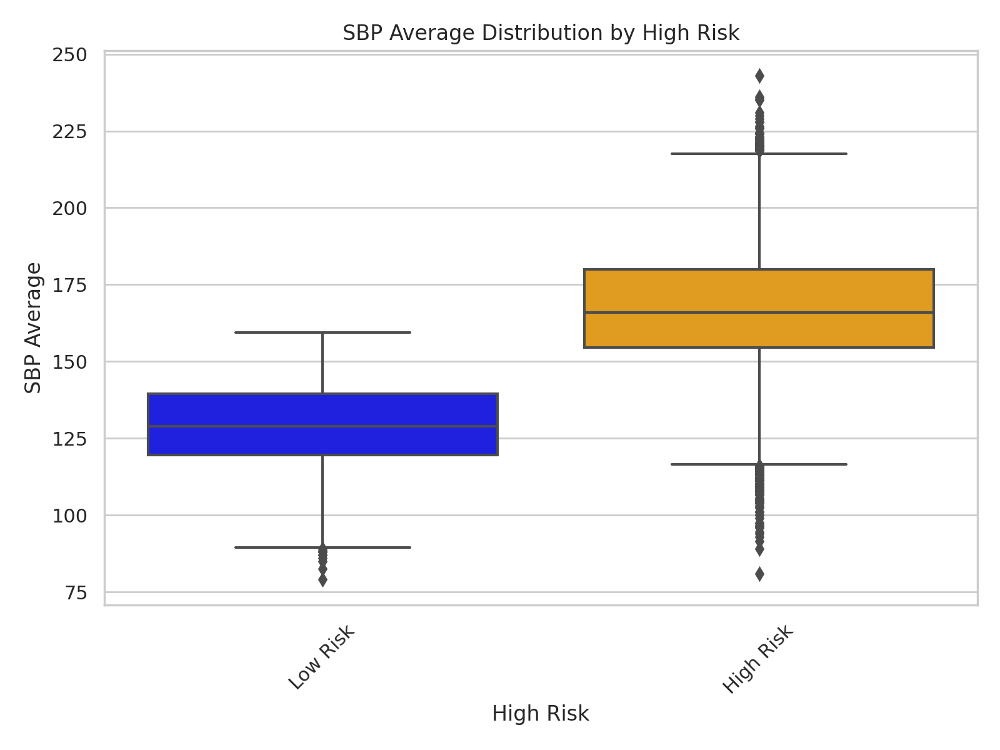

In [186]:
colors = ["blue", "orange"]
sns.set_palette(sns.color_palette(colors))

# Create a box plot to visualize sbp_avg distribution by highrisk
plt.figure(figsize=(8, 6))
ax = sns.boxplot(data=df3, x='highrisk', y='sbp_avg')
ax.set_xticklabels(['Low Risk', 'High Risk'], rotation=45)
plt.title('SBP Average Distribution by High Risk')
plt.xlabel('High Risk')
plt.ylabel('SBP Average')
plt.tight_layout()
plt.show()

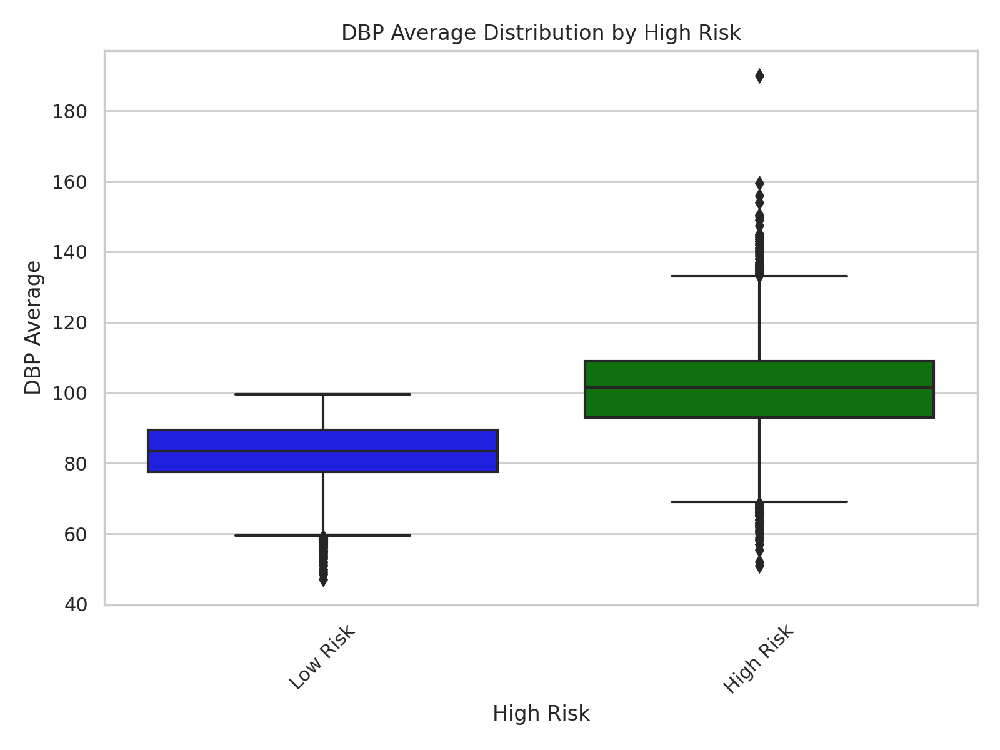

In [187]:
colors = ["blue", "green"]
sns.set_palette(sns.color_palette(colors))

# Create a box plot to visualize dbp_avg distribution by highrisk
plt.figure(figsize=(8, 6))
ax = sns.boxplot(data=df3, x='highrisk', y='dbp_avg')
ax.set_xticklabels(['Low Risk', 'High Risk'], rotation=45)
plt.title('DBP Average Distribution by High Risk')
plt.xlabel('High Risk')
plt.ylabel('DBP Average')
plt.tight_layout()
plt.show()

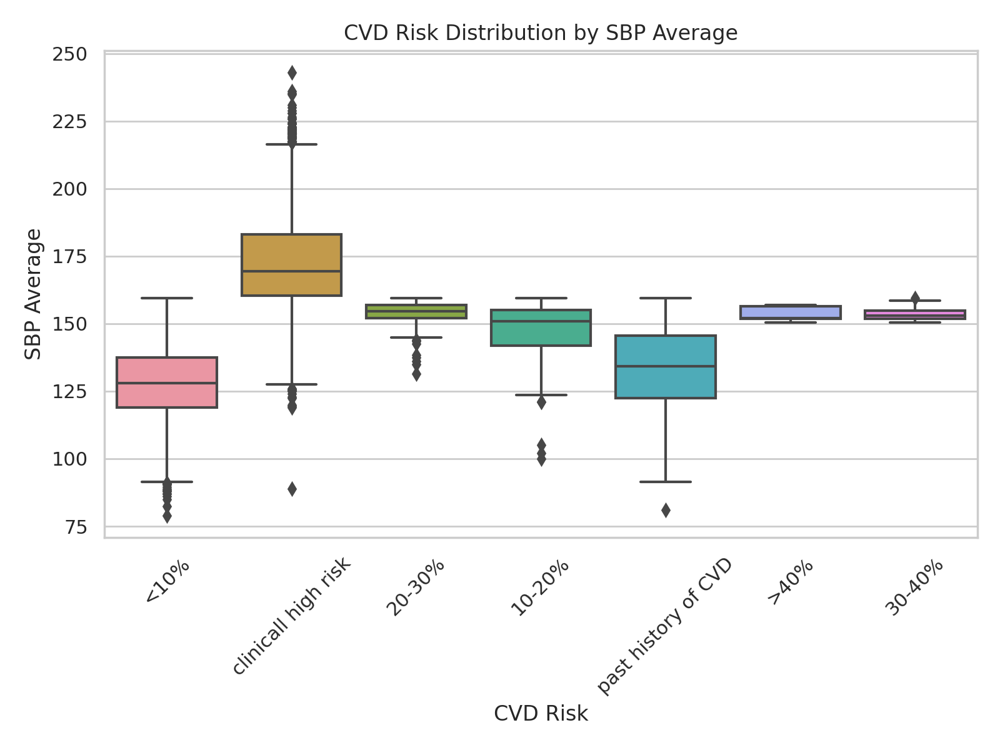

In [188]:
colors = ["skyblue", "orange"]
sns.set_palette(sns.color_palette(colors))

# Create a box plot to visualize cvdrisk distribution by sbp_avg
plt.figure(figsize=(8, 6))
ax = sns.boxplot(data=df3, x='cvdrisk', y='sbp_avg')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.title('CVD Risk Distribution by SBP Average')
plt.xlabel('CVD Risk')
plt.ylabel('SBP Average')
plt.tight_layout()
plt.show()

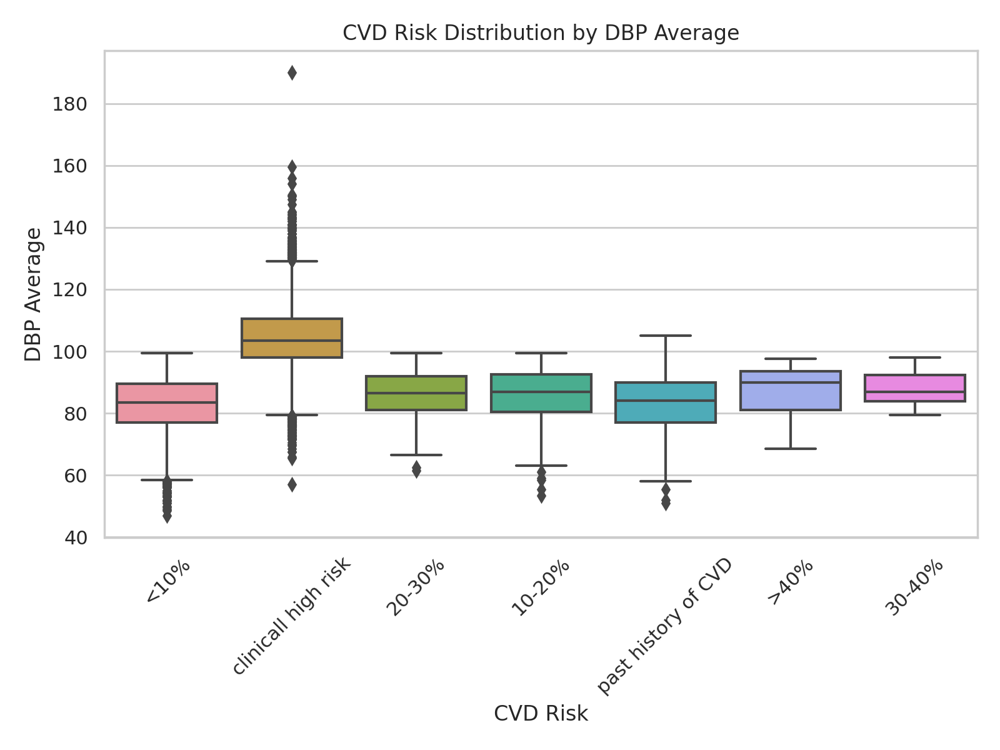

In [189]:
colors = ["skyblue", "orange"]
sns.set_palette(sns.color_palette(colors))

# Create a box plot to visualize cvdrisk distribution by sbp_avg
plt.figure(figsize=(8, 6))
ax = sns.boxplot(data=df3, x='cvdrisk', y='dbp_avg')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.title('CVD Risk Distribution by DBP Average')
plt.xlabel('CVD Risk')
plt.ylabel('DBP Average')
plt.tight_layout()
plt.show()

In [190]:
df3.columns

Index(['patient_id', 'age', 'sex', 'education', 'marital_status', 'occupation',
       'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi', 'smoking', 'village', 'areas',
       'cvdrisk', 'highrisk', 'bplt', 'lltt', 'aptt'],
      dtype='object')

In [191]:
summary = pd.DataFrame(df3.describe(include='all'))
print(summary)

          patient_id           age     sex education marital_status  \
count   2.162200e+04  21622.000000   21622     21622          21622   
unique           NaN           NaN       2         3              4   
top              NaN           NaN  Female   primary        married   
freq             NaN           NaN   12205     13103          17719   
mean    6.012693e+11     54.784109     NaN       NaN            NaN   
std     1.762154e+12     10.693276     NaN       NaN            NaN   
min     7.709001e+09     40.000000     NaN       NaN            NaN   
25%     1.020200e+11     46.000000     NaN       NaN            NaN   
50%     1.030300e+11     53.000000     NaN       NaN            NaN   
75%     1.040400e+11     61.000000     NaN       NaN            NaN   
max     9.711270e+12    116.000000     NaN       NaN            NaN   

         occupation       sbp_avg       dbp_avg       bg_mgdl           bmi  \
count         21622  21622.000000  21622.000000  21622.000000  21622

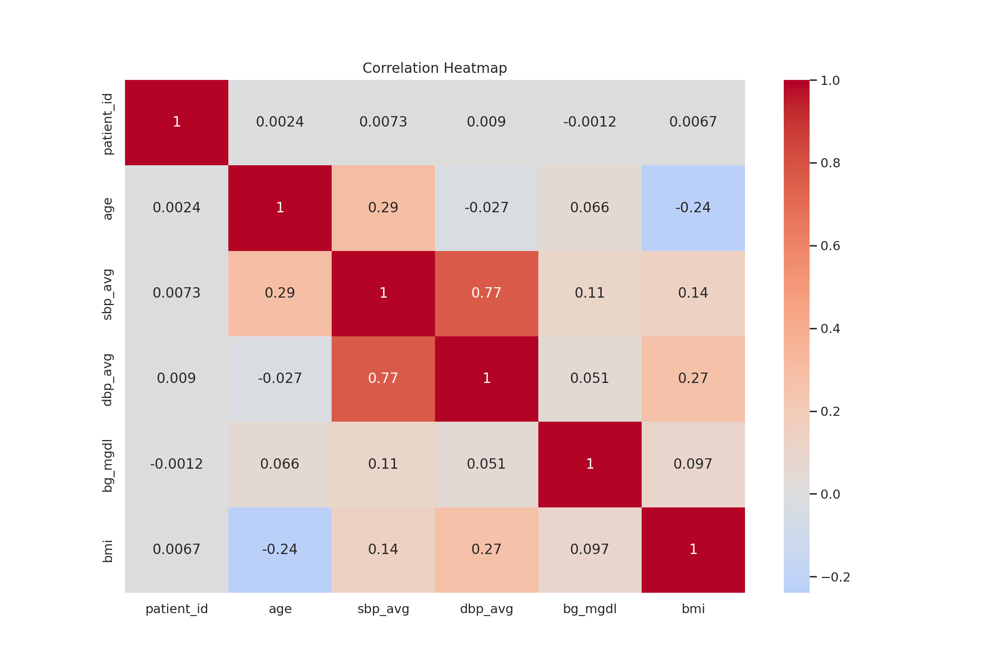

In [192]:
correlation_matrix = df3.select_dtypes(include=['number']).corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.show()

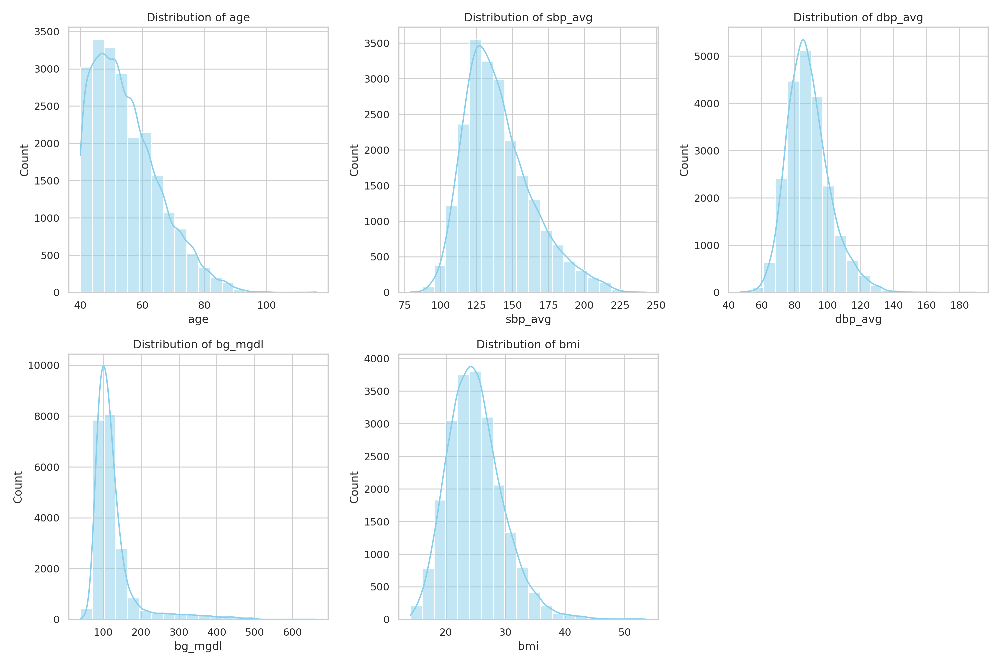

In [193]:
numeric_features = ['age', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']
plt.figure(figsize=(15, 10))
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(2, 3, i)
    sns.histplot(data=df3, x=feature, bins=20, kde=True)
    plt.title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()


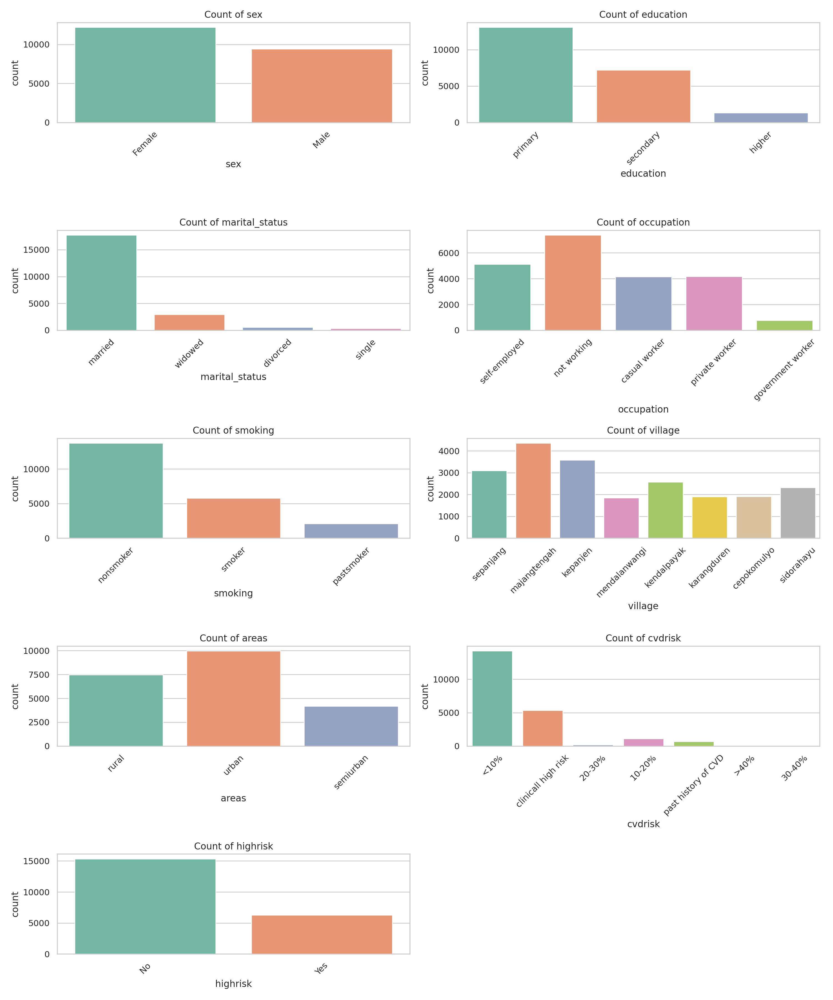

In [194]:
categorical_features = ['sex', 'education', 'marital_status', 'occupation', 'smoking', 'village', 'areas', 'cvdrisk', 'highrisk']
plt.figure(figsize=(15, 18))
for i, feature in enumerate(categorical_features, 1):
    plt.subplot(5, 2, i)
    sns.countplot(data=df3, x=feature, palette='Set2')
    plt.title(f'Count of {feature}')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

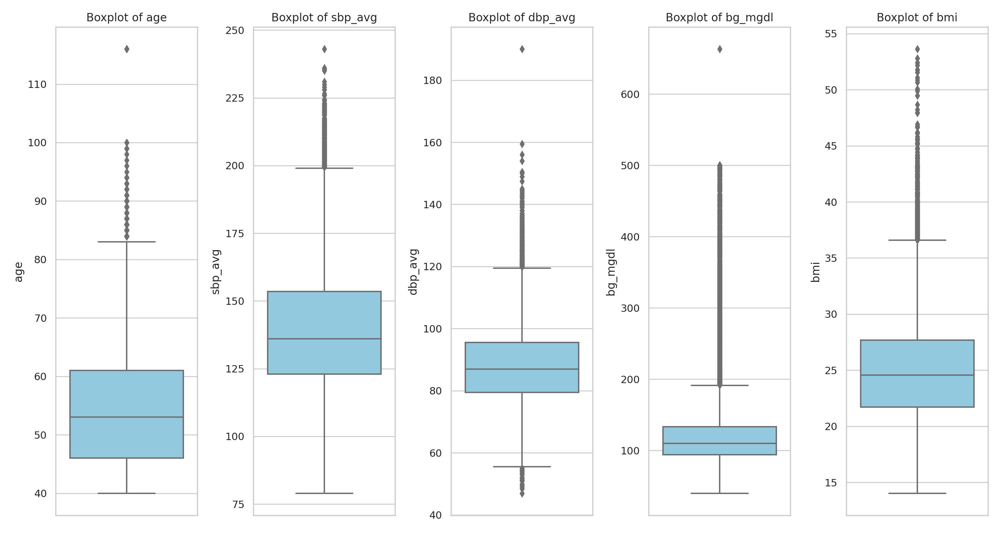

In [195]:
numeric_features = ['age', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']

# Create box plots for outlier detection
plt.figure(figsize=(15, 8))
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(1, len(numeric_features), i)
    sns.boxplot(data=df3, y=feature)
    plt.title(f'Boxplot of {feature}')
plt.tight_layout()
plt.show()

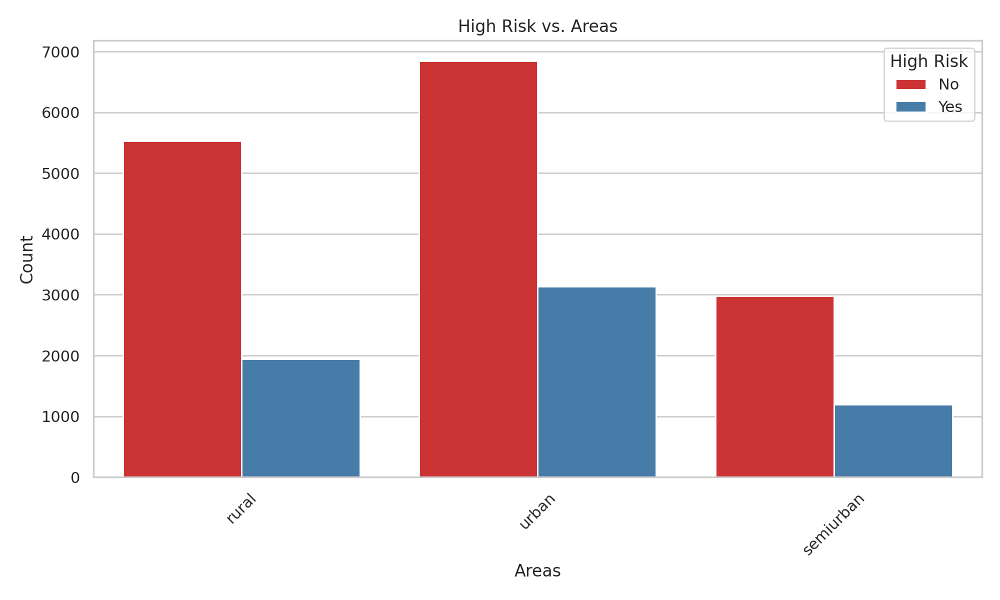

In [196]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df3, x='areas', hue='highrisk', palette='Set1')
plt.title('High Risk vs. Areas')
plt.xlabel('Areas')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='High Risk')
plt.tight_layout()
plt.show()

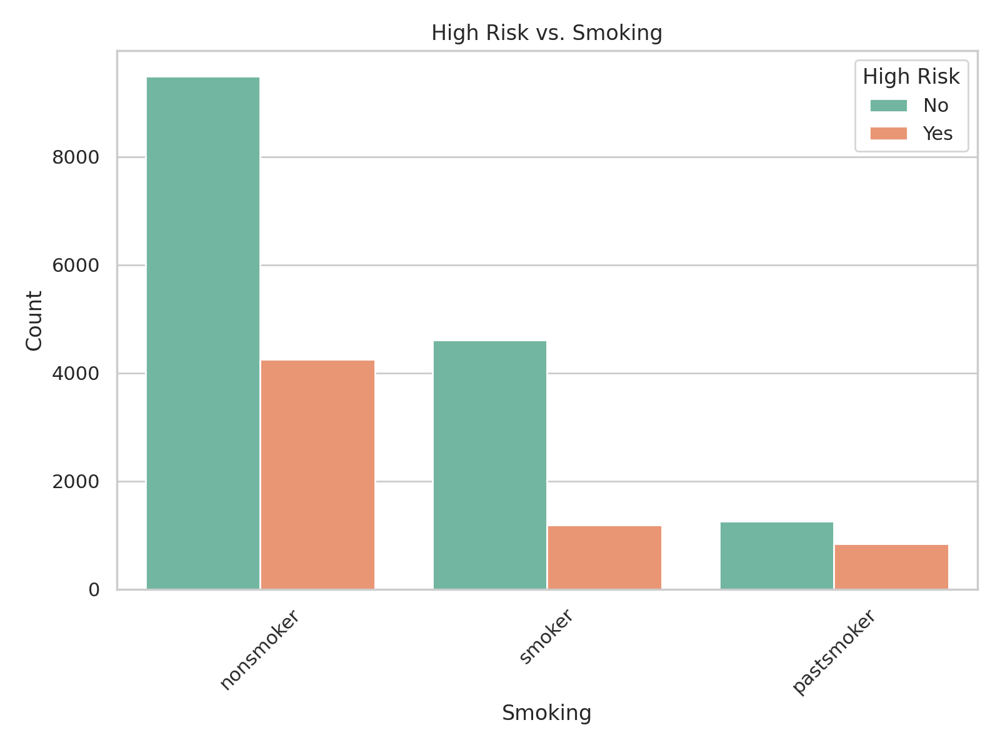

In [197]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df3, x='smoking', hue='highrisk', palette='Set2')
plt.title('High Risk vs. Smoking')
plt.xlabel('Smoking')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='High Risk')
plt.tight_layout()
plt.show()

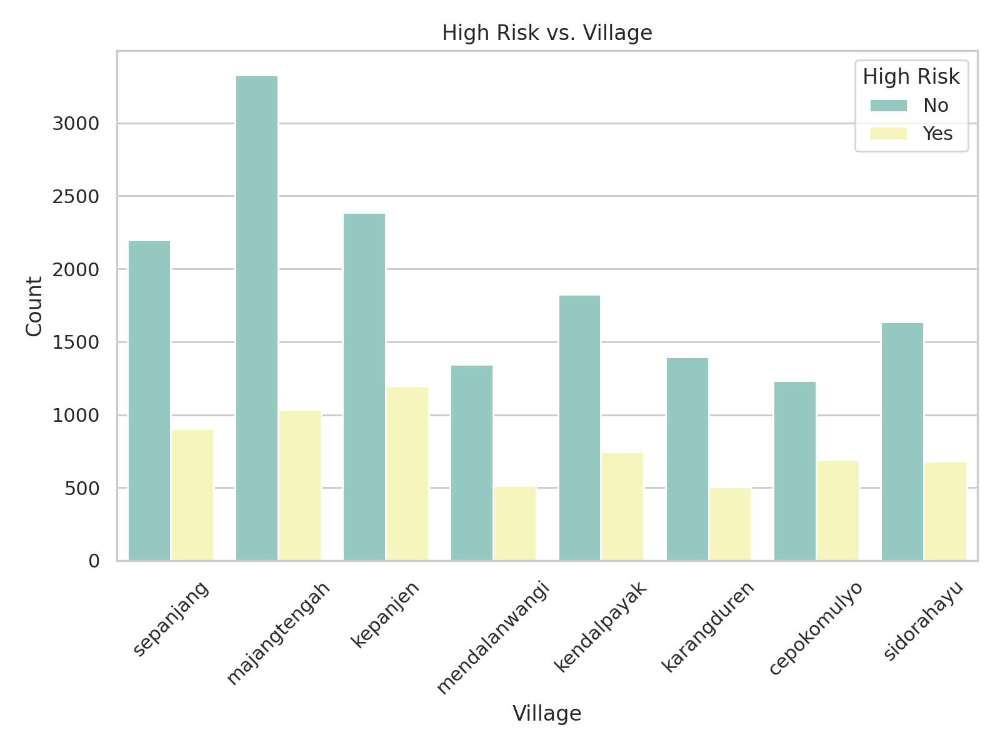

In [198]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df3, x='village', hue='highrisk', palette='Set3')
plt.title('High Risk vs. Village')
plt.xlabel('Village')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='High Risk')
plt.tight_layout()
plt.show()

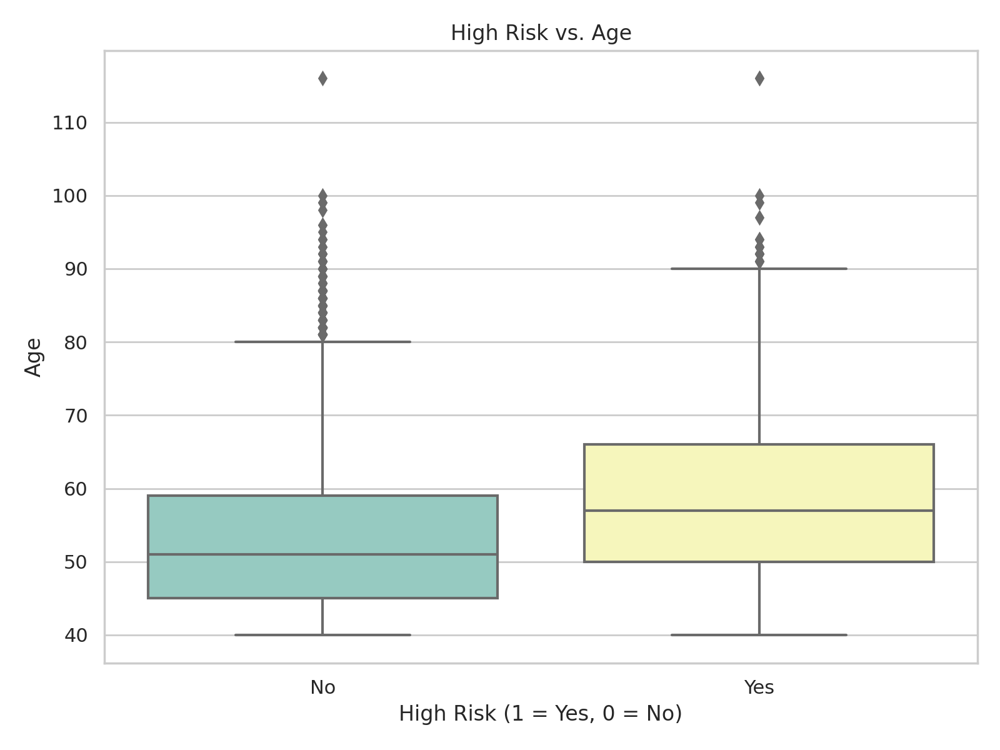

In [199]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df3, x='highrisk', y='age', palette='Set3')
plt.title('High Risk vs. Age')
plt.xlabel('High Risk (1 = Yes, 0 = No)')
plt.ylabel('Age')
plt.tight_layout()
plt.show()

**Class Balancing for Target Variable:**

In [200]:
!pip install --upgrade "kaleido==0.1.*"
# Install plotnine if not already installed
!pip install plotnine

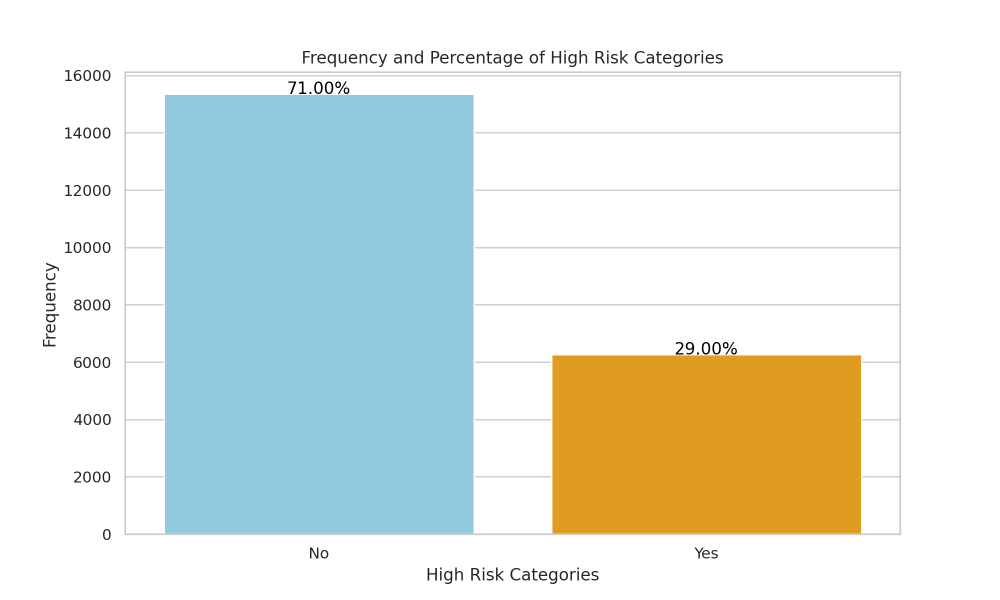

In [201]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'df3' is your DataFrame and 'highrisk' is the column of interest
# Calculate the count for each category in 'highrisk'
highrisk_counts = df3['highrisk'].value_counts().reset_index()
highrisk_counts.columns = ['highrisk', 'count']

# Calculate the percentage for each category
total = df3['highrisk'].count()
highrisk_counts['percentage'] = (highrisk_counts['count'] / total) * 100

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 6))  # Set the figure size
barplot = sns.barplot(x='highrisk', y='count', data=highrisk_counts, ci=None)

# Add text labels for the percentage on top of each bar
for index, row in highrisk_counts.iterrows():
    barplot.text(row.name, row['count'], f'{row["percentage"]:.2f}%', color='black', ha="center")

# Set the title and labels of the plot
plt.title('Frequency and Percentage of High Risk Categories')
plt.xlabel('High Risk Categories')
plt.ylabel('Frequency')

# Show the plot
plt.show()

# Save the plot as an image file
# plt.savefig('high


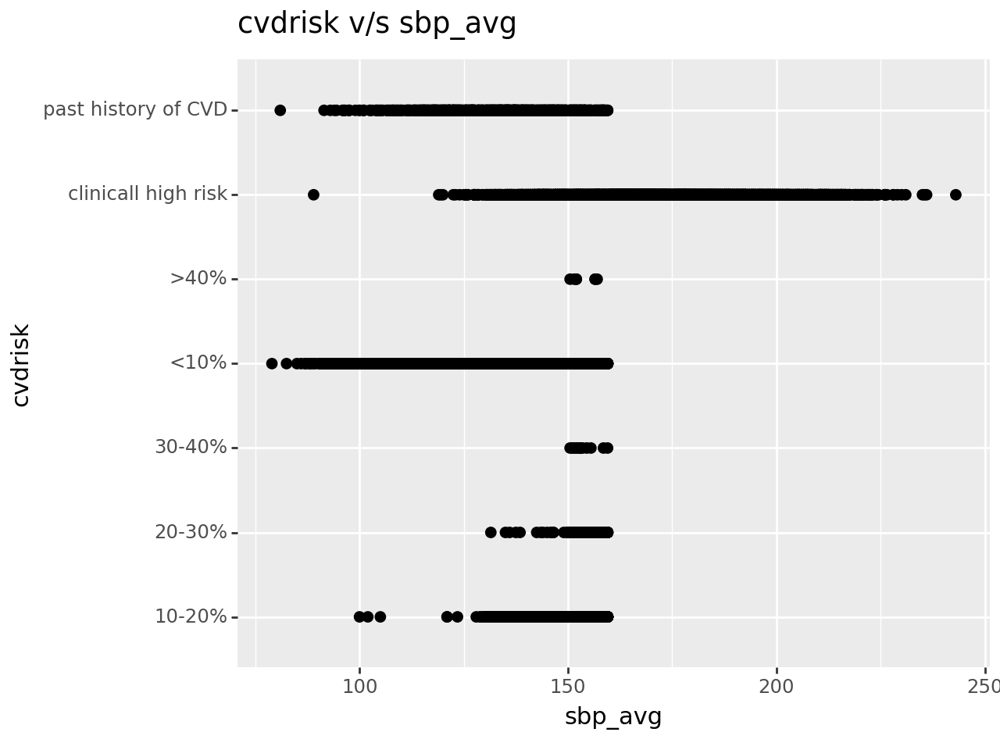

In [243]:
!pip install plotnine
from plotnine import ggplot, aes, geom_point, labs


inspection_sbp = df3[['sbp_avg','cvdrisk']]
inspection_sbp

data = pd.DataFrame({
    'x_variable': inspection_sbp.iloc[:, 0],
    'y_variable': inspection_sbp.iloc[:, 1]
})

# Create a ggplot scatter plot
scatter_plot = (
    ggplot(data, aes(x='x_variable', y='y_variable')) +
    geom_point(size=2, color='black') +
    labs(
        title='cvdrisk v/s sbp_avg',  # Adjust with your desired title
        x='sbp_avg',                # Adjust 'X Axis Label' accordingly
        y='cvdrisk'                 # Adjust 'Y Axis Label' accordingly
    )
)

print(scatter_plot)



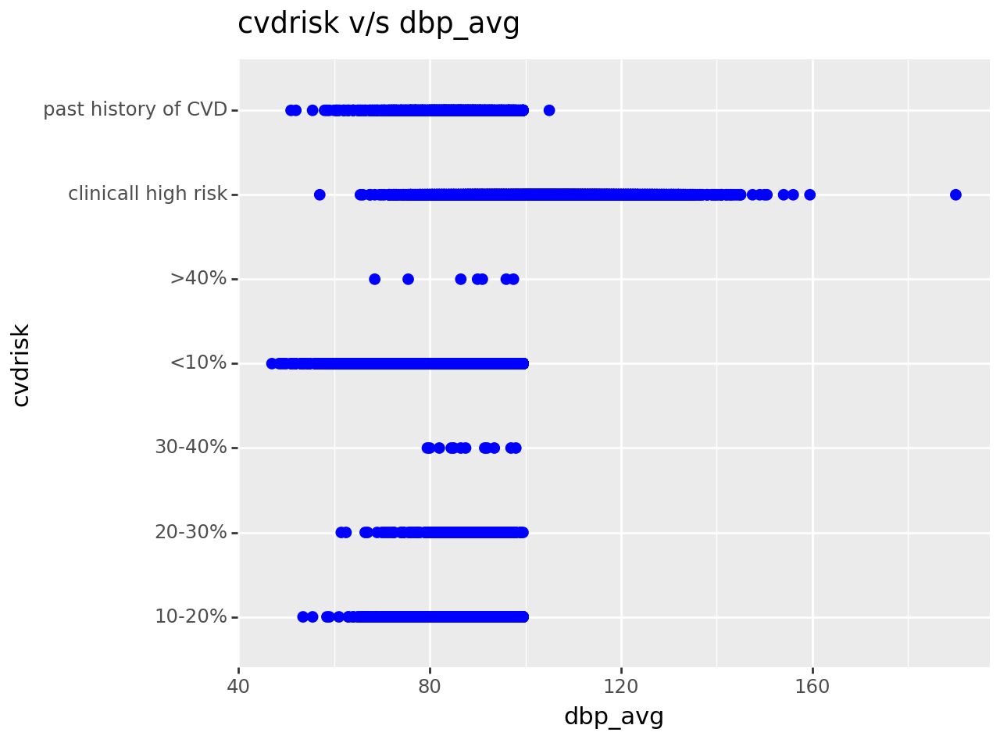

In [244]:
inspection_dbp = df3[['dbp_avg','cvdrisk']]
inspection_dbp

# Assuming inspection_sbp is a DataFrame with two columns
data = pd.DataFrame({
    'x_variable': inspection_dbp.iloc[:, 0],
    'y_variable': inspection_dbp.iloc[:, 1]
})

# Create a ggplot scatter plot
scatter_plot = (
    ggplot(data, aes(x='x_variable', y='y_variable')) +
    geom_point(size=2, color='blue') +
    labs(
        title='cvdrisk v/s dbp_avg',  # Adjust with your desired title
        x='dbp_avg',                # Adjust 'X Axis Label' accordingly
        y='cvdrisk'                 # Adjust 'Y Axis Label' accordingly
    )
)

print(scatter_plot)



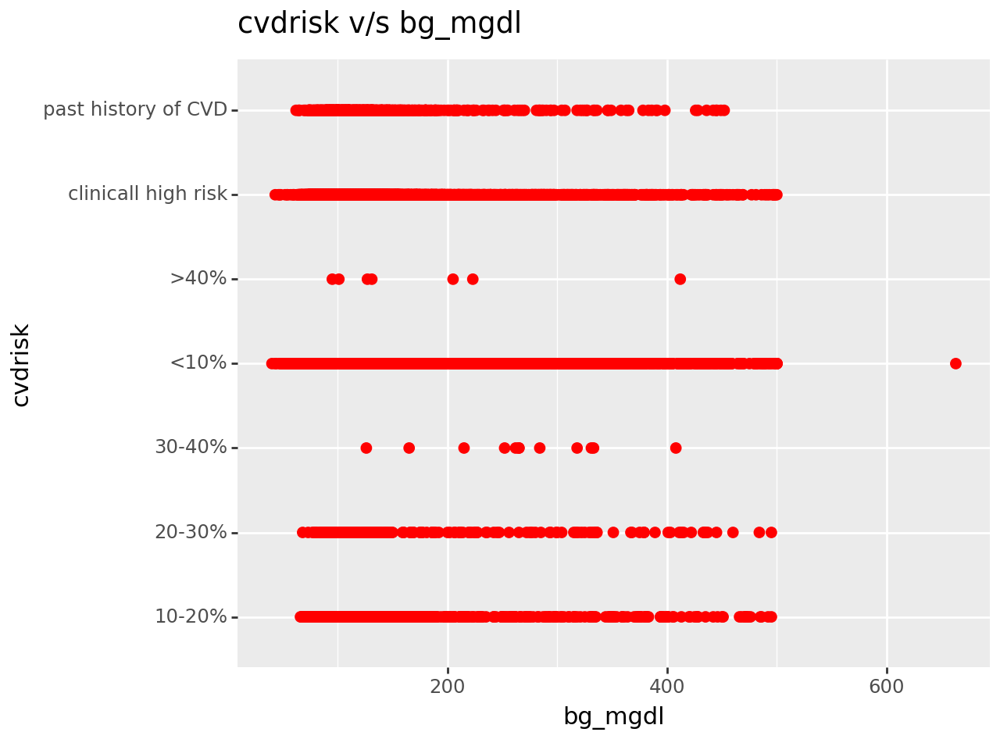

In [245]:
inspection_bg_mgdl = df3[['bg_mgdl','cvdrisk']]
inspection_bg_mgdl

# Assuming inspection_sbp is a DataFrame with two columns
data = pd.DataFrame({
    'x_variable': inspection_bg_mgdl.iloc[:, 0],
    'y_variable': inspection_bg_mgdl.iloc[:, 1]
})

# Create a ggplot scatter plot
scatter_plot = (
    ggplot(data, aes(x='x_variable', y='y_variable')) +
    geom_point(size=2, color='red') +
    labs(
        title='cvdrisk v/s bg_mgdl',  # Adjust with your desired title
        x='bg_mgdl',                # Adjust 'X Axis Label' accordingly
        y='cvdrisk'                 # Adjust 'Y Axis Label' accordingly
    )
)

print(scatter_plot)


In [202]:
# Select only numeric columns for z-score calculation
numeric_columns = df3.select_dtypes(include=[np.number])

# Calculate z-scores for numeric columns
z_scores = np.abs(stats.zscore(numeric_columns))

# Set a threshold for z-scores above which values are considered outliers
threshold = 3

# Create a boolean mask for identifying outliers in any column
outlier_mask = (z_scores > threshold).any(axis=1)

# Create a new DataFrame without outliers
df_no_outliers = df3[~outlier_mask]

# Display the top 5 rows of the DataFrame without outliers
df_no_outliers.describe()


,patient_id,age,sbp_avg,dbp_avg,bg_mgdl,bmi
count,1.967900e+04,19679.000000,19679.000000,19679.000000,19679.000000,19679.000000
mean,3.168617e+11,54.497332,139.092535,87.834976,117.360892,24.794842
std,8.468502e+11,10.358513,22.457939,12.278677,37.725876,4.386536
min,7.709001e+09,40.000000,79.000000,49.500000,40.000000,14.073940
25%,1.020200e+11,46.000000,122.500000,79.000000,93.000000,21.644120
50%,1.030300e+11,53.000000,135.500000,86.500000,109.000000,24.456060
75%,1.040400e+11,61.000000,152.500000,95.000000,130.000000,27.548210
max,5.691160e+12,86.000000,211.000000,127.000000,307.000000,39.001190


In [203]:
# make the numeric columns in two digits

# Select only numeric columns for formatting
numeric_columns = df_no_outliers.select_dtypes(include=[np.number])

# Format numeric columns to two decimal places
df_no_outliers[numeric_columns.columns] = numeric_columns.applymap(lambda x: round(x, 2))

# Display the DataFrame with formatted numeric columns
df_no_outliers.describe()


,patient_id,age,sbp_avg,dbp_avg,bg_mgdl,bmi
count,1.967900e+04,19679.000000,19679.000000,19679.000000,19679.000000,19679.000000
mean,3.168617e+11,54.497332,139.092535,87.834976,117.360892,24.794818
std,8.468502e+11,10.358513,22.457939,12.278677,37.725876,4.386452
min,7.709001e+09,40.000000,79.000000,49.500000,40.000000,14.070000
25%,1.020200e+11,46.000000,122.500000,79.000000,93.000000,21.640000
50%,1.030300e+11,53.000000,135.500000,86.500000,109.000000,24.460000
75%,1.040400e+11,61.000000,152.500000,95.000000,130.000000,27.550000
max,5.691160e+12,86.000000,211.000000,127.000000,307.000000,39.000000


In [204]:
# I have DataFrame named 'df_no_outliers' i will just make the copy to perform one hot encoding then apply the L.R
df4 = df_no_outliers.copy()

# List of binary columns I want to encode
binary_columns = ['highrisk', 'bplt', 'lltt', 'aptt', 'sex', 'smoking']  # Add your column names here

# Iterate through the binary columns and perform one-hot encoding
for column in binary_columns:
    df4[column] = df4[column].apply(lambda x: 1 if x == 'yes' else 0)

# Display the first few rows of the DataFrame after encoding
df4.head()


,patient_id,age,sex,education,marital_status,occupation,sbp_avg,dbp_avg,bg_mgdl,bmi,smoking,village,areas,cvdrisk,highrisk,bplt,lltt,aptt
0,7.709001e+09,65,0,primary,married,self-employed,140.5,78.5,156.0,18.90,0,sepanjang,rural,<10%,0,0,0,0
1,7.709001e+09,60,0,primary,married,self-employed,156.0,108.5,113.0,25.48,0,sepanjang,rural,clinicall high risk,0,0,0,0
3,8.005070e+09,82,0,primary,married,not working,152.0,76.0,114.0,23.89,0,majangtengah,rural,20-30%,0,0,0,0
4,8.005070e+09,55,0,primary,widowed,casual worker,179.0,94.0,130.0,29.49,0,majangtengah,rural,clinicall high risk,0,0,0,0
9,1.013100e+10,85,0,primary,married,casual worker,122.0,78.5,99.0,25.63,0,sepanjang,rural,<10%,0,0,0,0


In [205]:
categorical_columns_to_remove = ['education', 'marital_status', 'occupation', 'village' , 'areas', 'cvdrisk']  # Add the column names you want to remove

# Drop the specified categorical columns
X_no_categorical = df4.drop(columns=categorical_columns_to_remove)

# Display the first few rows of the DataFrame after removing columns
X_no_categorical.head()

,patient_id,age,sex,sbp_avg,dbp_avg,bg_mgdl,bmi,smoking,highrisk,bplt,lltt,aptt
0,7.709001e+09,65,0,140.5,78.5,156.0,18.90,0,0,0,0,0
1,7.709001e+09,60,0,156.0,108.5,113.0,25.48,0,0,0,0,0
3,8.005070e+09,82,0,152.0,76.0,114.0,23.89,0,0,0,0,0
4,8.005070e+09,55,0,179.0,94.0,130.0,29.49,0,0,0,0,0
9,1.013100e+10,85,0,122.0,78.5,99.0,25.63,0,0,0,0,0


### Linear Regression:

In [206]:
# Select features (X) and target (y)
features = X_no_categorical.drop(columns=['highrisk','age','sex','sbp_avg','dbp_avg','bg_mgdl','bmi','smoking','bplt','lltt','aptt'])  # Replace 'target_column' with my target columns
target = X_no_categorical['highrisk']  # Replace 'target_column' with my target column name

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Initialize the Linear Regression model
model = LinearRegression()

# Train the model on the training data
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Calculate and display model performance metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse:.2f}")
print(f"R-squared: {r2:.2f}")


Mean Squared Error: 0.00
R-squared: 1.00


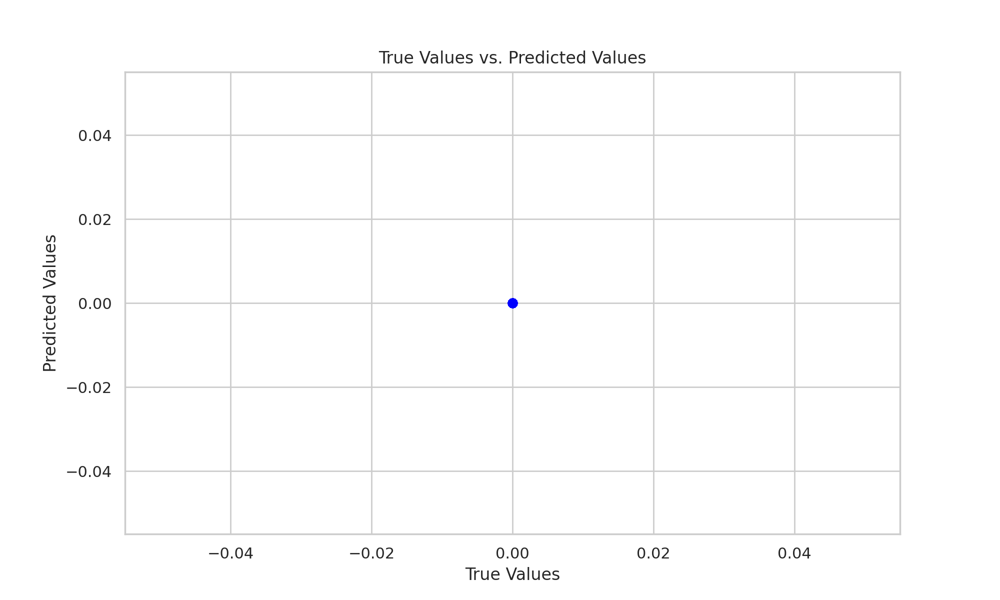

In [207]:
# Create a LR visualization
plt.figure(figsize=(10, 6))

# Scatter plot of true values vs. predicted values
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2)

plt.title("True Values vs. Predicted Values")
plt.xlabel("True Values")
plt.ylabel("Predicted Values")

plt.show()


### Logistic Regression :

In [208]:

# Select features (including both numerical and categorical columns)
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]
y = df3['highrisk']

# Define which columns are categorical (in this case, 'sex' is categorical)
categorical_cols = ['sex']

# Define a transformer to one-hot encode categorical columns
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_cols)
    ])

# Append classifier to preprocessing pipeline
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', LogisticRegression())])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the model
clf.fit(X_train, y_train)

# Predictions
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")


Accuracy: 0.7102890173410404


### Visualization (Log.Reg) :

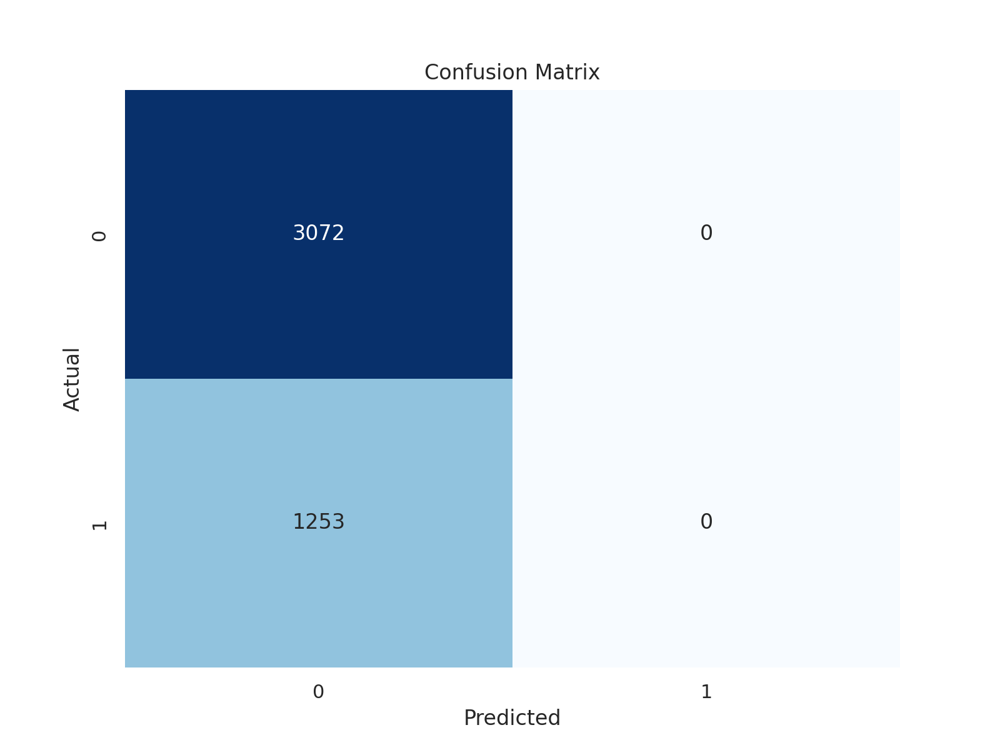

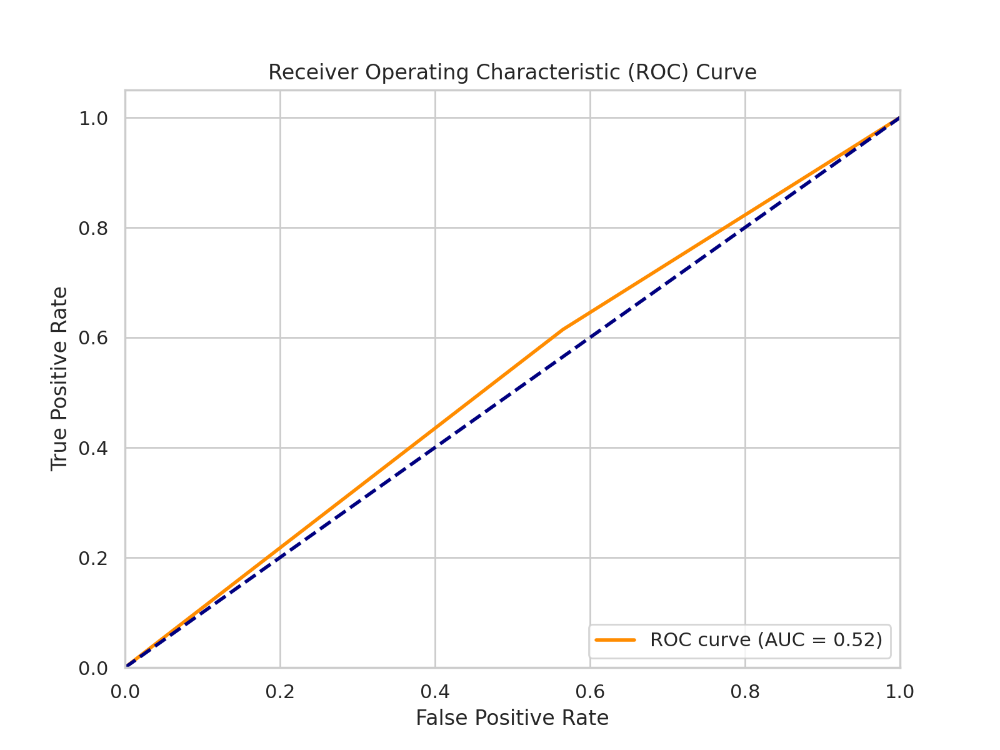

In [209]:


# Encode the target variable 'highrisk' to binary labels (0 and 1)
label_encoder = LabelEncoder()
y_test_encoded = label_encoder.fit_transform(y_test)
y_pred_encoded = label_encoder.transform(y_pred)

# Calculate the confusion matrix
cm = confusion_matrix(y_test_encoded, y_pred_encoded)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Calculate ROC curve and AUC (Area Under the Curve)
y_prob = clf.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_encoded, y_prob)
roc_auc = roc_auc_score(y_test_encoded, y_prob)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


### XG Boost:

In [210]:
# Select features (including both numerical and categorical columns)
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]

# Encode the target variable 'highrisk' using LabelEncoder
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df3['highrisk'])

# Define which columns are categorical (in this case, 'sex' is categorical)
categorical_cols = ['sex']

# Define a transformer to one-hot encode categorical columns
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_cols)
    ])

# Append classifier to preprocessing pipeline
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', xgb.XGBClassifier())])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the XGBoost model
clf.fit(X_train, y_train)

# Predictions
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")


Accuracy: 0.7102890173410404


#### Visualization (XG Boost):

Accuracy: 0.7102890173410404


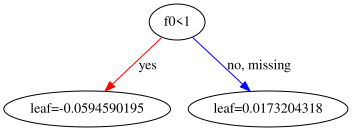

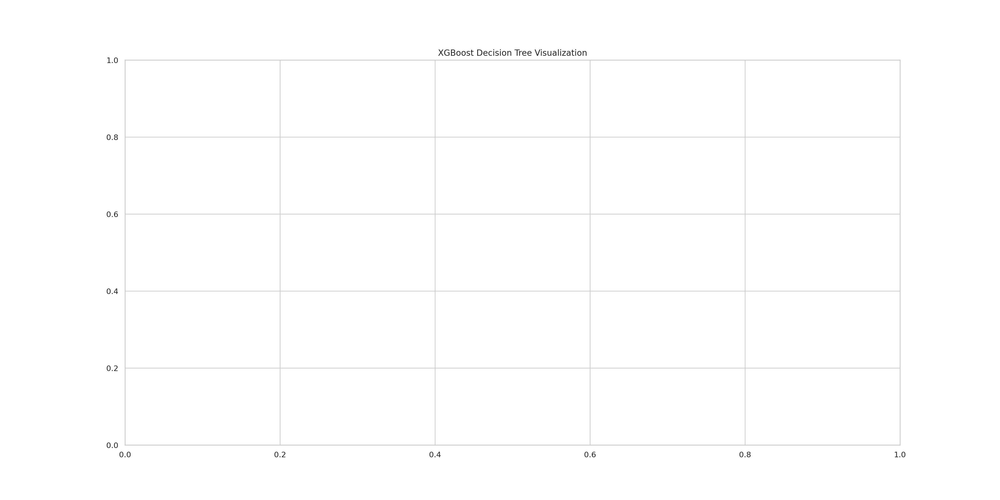

In [211]:

# Select features (including both numerical and categorical columns)
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]

# Encode the target variable 'highrisk' using LabelEncoder
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df3['highrisk'])

# Define which columns are categorical (in this case, 'sex' is categorical)
categorical_cols = ['sex']

# Define a transformer to one-hot encode categorical columns
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_cols)
    ])

# Append classifier to preprocessing pipeline with an XGBoost classifier
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', xgb.XGBClassifier())])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the XGBoost model
clf.fit(X_train, y_train)

# Predictions
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Extract one of the trees from the ensemble (you can change the index)
individual_tree = clf.named_steps['classifier'].get_booster().get_dump()[0]
# individual_tree = clf.named_steps['classifier'].get_booster().get_dump()[0]

from IPython.display import display

# Assuming you have already fitted your XGBoost model 'clf'
# Extract one of the trees from the ensemble (you can change the index)
individual_tree = xgb.to_graphviz(clf.named_steps['classifier'], num_trees=0)

# Display the selected tree
display(individual_tree)



# Assuming you have already fitted your XGBoost model 'clf'
# Extract one of the trees from the ensemble (you can change the index)
individual_tree = xgb.to_graphviz(clf.named_steps['classifier'], num_trees=0)

# Visualize the selected tree
plt.figure(figsize=(20, 10))  # Adjust the figure size as needed
plt.title("XGBoost Decision Tree Visualization")
plt.show()


### Svm:

In [212]:

# Select features (including both numerical and categorical columns)
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]

# Encode the target variable 'highrisk' using Label Encoding
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df3['highrisk'])

# Define which columns are categorical (in this case, 'sex' is categorical)
categorical_cols = ['sex']

# Define a transformer to one-hot encode categorical columns
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_cols)
    ])

# Append classifier to preprocessing pipeline
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', SVC())])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the SVM model
clf.fit(X_train, y_train)

# Predictions
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")


Accuracy: 0.7102890173410404


### Visualization (SVM):

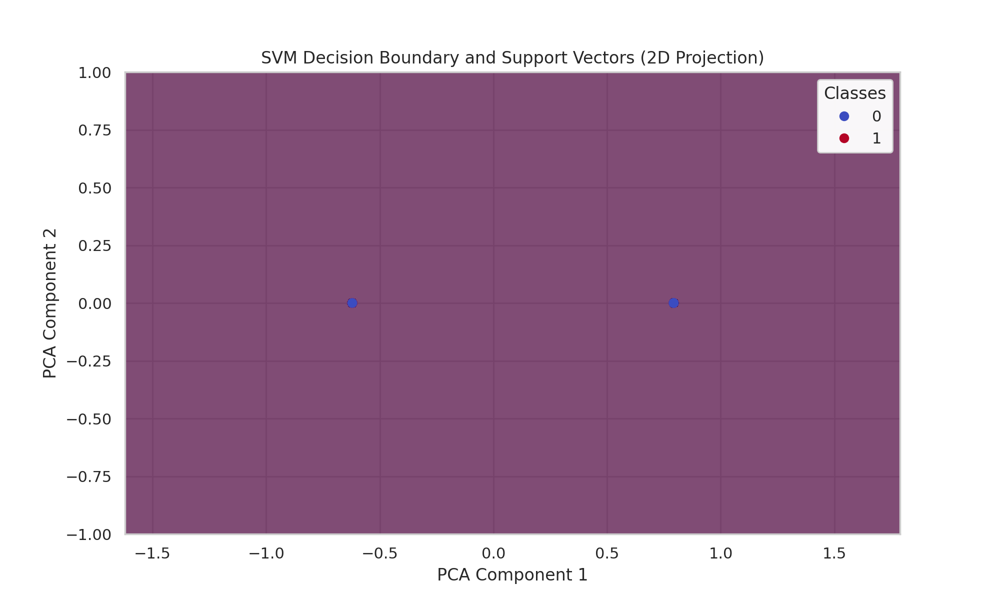

In [213]:

# Select features (including both numerical and categorical columns)
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]

# Encode the target variable 'highrisk' using Label Encoding
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df3['highrisk'])

# Define which columns are categorical (in this case, 'sex' is categorical)
categorical_cols = ['sex']

# Define a transformer to one-hot encode categorical columns
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_cols)
    ])

# Append classifier to preprocessing pipeline
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', SVC())])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply one-hot encoding to the categorical columns
X_train_encoded = preprocessor.fit_transform(X_train)
X_test_encoded = preprocessor.transform(X_test)

# Reduce the feature space to two dimensions for visualization
pca = PCA(n_components=2)
X_train_2d = pca.fit_transform(X_train_encoded)
X_test_2d = pca.transform(X_test_encoded)

# Fit the SVM model on the reduced feature space
clf_2d = SVC()
clf_2d.fit(X_train_2d, y_train)

# Plot the decision boundary and support vectors
plt.figure(figsize=(10, 6))

# Create a meshgrid of points to plot decision boundary
x_min, x_max = X_train_2d[:, 0].min() - 1, X_train_2d[:, 0].max() + 1
y_min, y_max = X_train_2d[:, 1].min() - 1, X_train_2d[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                     np.arange(y_min, y_max, 0.01))

Z = clf_2d.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.contourf(xx, yy, Z, alpha=0.8)

# Scatter plot the data points
scatter = plt.scatter(X_train_2d[:, 0], X_train_2d[:, 1], c=y_train, cmap=plt.cm.coolwarm)
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")

# Create a legend for the scatter plot
legend1 = plt.legend(*scatter.legend_elements(),
                    title="Classes", loc="upper right")
ax = plt.gca()
ax.add_artist(legend1)

plt.title("SVM Decision Boundary and Support Vectors (2D Projection)")
plt.show()


#### Comments :

Overall, this visualization helps us understand how an SVM classifier separates data points into different classes in a two-dimensional space. The decision boundary is the line that separates the classes, and the support vectors are the data points closest to the decision boundary, which have the most influence on the model's classification decisions. The scatter plot shows the distribution of data points in this reduced feature space, and the legend provides clarity about which colors represent which class labels.

## Decision Tree Classifier :

In [214]:


# Select features (including both numerical and categorical columns)
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]

# Encode the target variable 'highrisk' using Label Encoding
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df3['highrisk'])

# Define which columns are categorical (in this case, 'sex' is categorical)
categorical_cols = ['sex']

# Define a transformer to one-hot encode categorical columns
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_cols)
    ])

# Append classifier to preprocessing pipeline
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', DecisionTreeClassifier())])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the Decision Tree model
clf.fit(X_train, y_train)

# Predictions
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Print the names of the steps in your pipeline
print(clf.named_steps.keys())


Accuracy: 0.7102890173410404
dict_keys(['preprocessor', 'classifier'])


### Visualization :

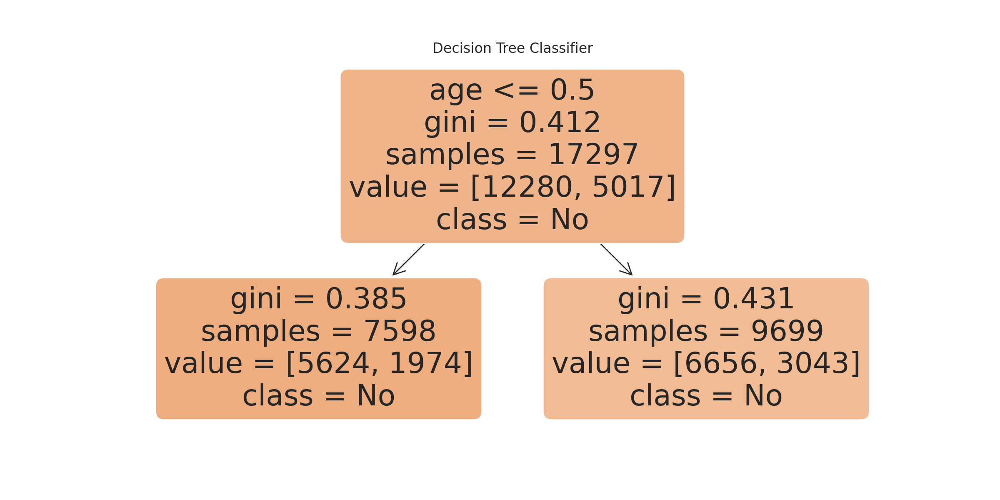

In [215]:
from sklearn.tree import plot_tree

# Plot the Decision Tree
plt.figure(figsize=(12, 6))
plot_tree(clf.named_steps['classifier'], feature_names=X.columns.tolist(), class_names=label_encoder.classes_.tolist(), filled=True, rounded=True)
plt.title("Decision Tree Classifier")
plt.show()


### Random Forest Application :

In [216]:

# Select features (including both numerical and categorical columns)
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]

# Encode the target variable 'highrisk' using Label Encoding
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df3['highrisk'])

# Define which columns are categorical (in this case, 'sex' is categorical)
categorical_cols = ['sex']

# Define a transformer to one-hot encode categorical columns
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_cols)
    ])

# Append classifier to preprocessing pipeline
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', RandomForestClassifier())])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the Random Forest model
clf.fit(X_train, y_train)

# Predictions
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")


Accuracy: 0.7102890173410404


### Visualization :

<Figure size 1200x800 with 0 Axes>

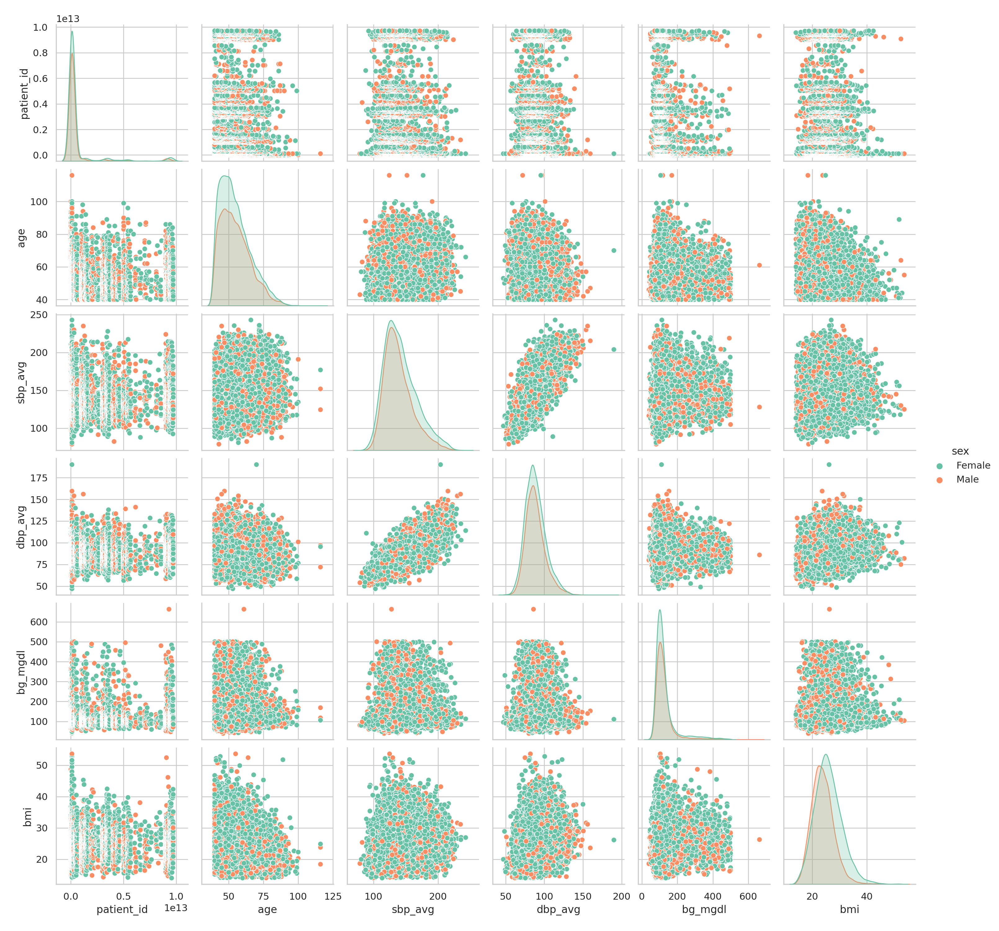

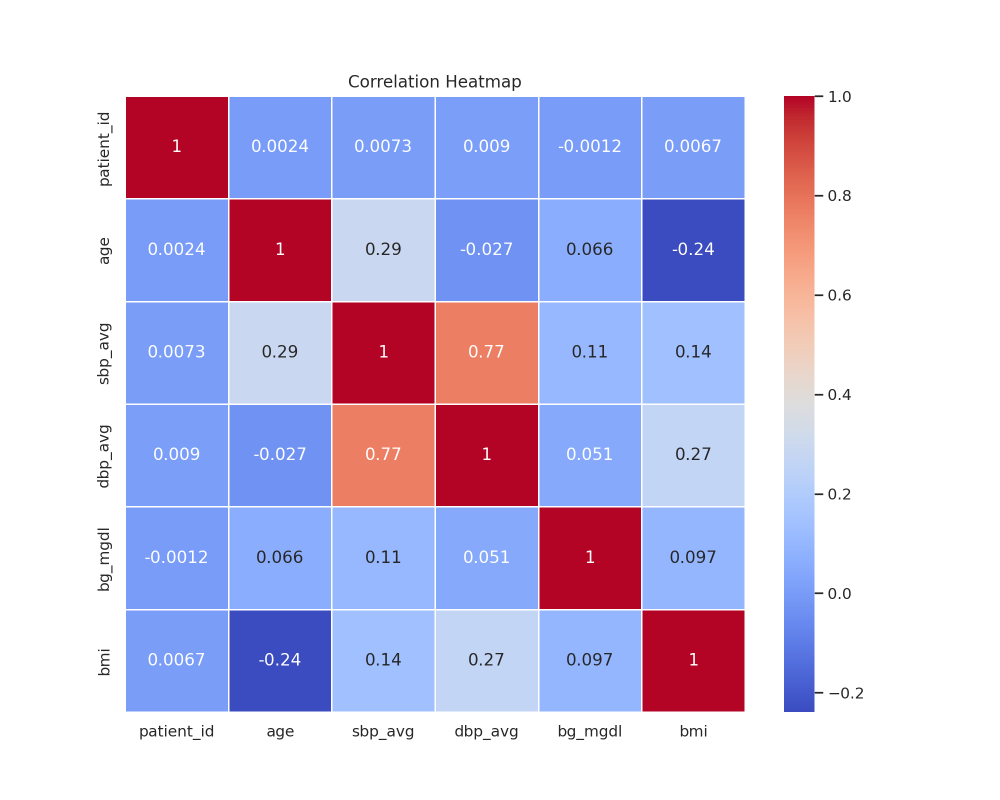

In [217]:
# Customize the Seaborn style (optional)
sns.set(style="whitegrid")

# Create a pair plot
plt.figure(figsize=(12, 8))  # Adjust the figure size
sns.pairplot(df3, hue='sex', palette="Set2", diag_kind="kde")

# Add titles
plt.suptitle("Pair Plot of Your Dataset", y=1.02)

# Show the plot
plt.show()

# Create a heatmap of correlations
plt.figure(figsize=(10, 8))  # Adjust the figure size
correlation_matrix = df3.select_dtypes(include=['number']).corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", linewidths=0.5)

# Add titles
plt.title("Correlation Heatmap")

# Show the plot
plt.show()


In [218]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from imblearn.over_sampling import SMOTE


# Define features and target variable
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]
y = df3['highrisk']  # 'highrisk' is our actual target variable

# Define which columns are categorical (in this case, 'sex' is categorical)
categorical_cols = ['sex']

# Define a transformer to one-hot encode categorical columns
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_cols)
    ])

# Append classifier to preprocessing pipeline
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', LogisticRegression())])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # class balancing by using SMOTE
# sm=SMOTE()
# X_train, y_train = sm.fit_resample(X_train, y_train)


# Fit the model
clf.fit(X_train, y_train)

# Predictions
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")


Accuracy: 0.7102890173410404


Learning rate set to 0.034797
0:	learn: 0.6381290	total: 7.51ms	remaining: 7.51s
1:	learn: 0.5852810	total: 13.1ms	remaining: 6.56s
2:	learn: 0.5375619	total: 18.7ms	remaining: 6.22s
3:	learn: 0.5019543	total: 24.7ms	remaining: 6.15s
4:	learn: 0.4638587	total: 30.4ms	remaining: 6.06s
5:	learn: 0.4316908	total: 36.7ms	remaining: 6.08s
6:	learn: 0.4035813	total: 42.6ms	remaining: 6.04s
7:	learn: 0.3758761	total: 48.6ms	remaining: 6.03s
8:	learn: 0.3528732	total: 54.5ms	remaining: 6s
9:	learn: 0.3311798	total: 60.4ms	remaining: 5.98s
10:	learn: 0.3125568	total: 66.2ms	remaining: 5.95s
11:	learn: 0.2957347	total: 72.4ms	remaining: 5.96s
12:	learn: 0.2812821	total: 78.6ms	remaining: 5.97s
13:	learn: 0.2687315	total: 84.6ms	remaining: 5.96s
14:	learn: 0.2577330	total: 90.5ms	remaining: 5.94s
15:	learn: 0.2478558	total: 96.6ms	remaining: 5.94s
16:	learn: 0.2378246	total: 103ms	remaining: 5.94s
17:	learn: 0.2299733	total: 109ms	remaining: 5.92s
18:	learn: 0.2230847	total: 115ms	remaining: 5.94

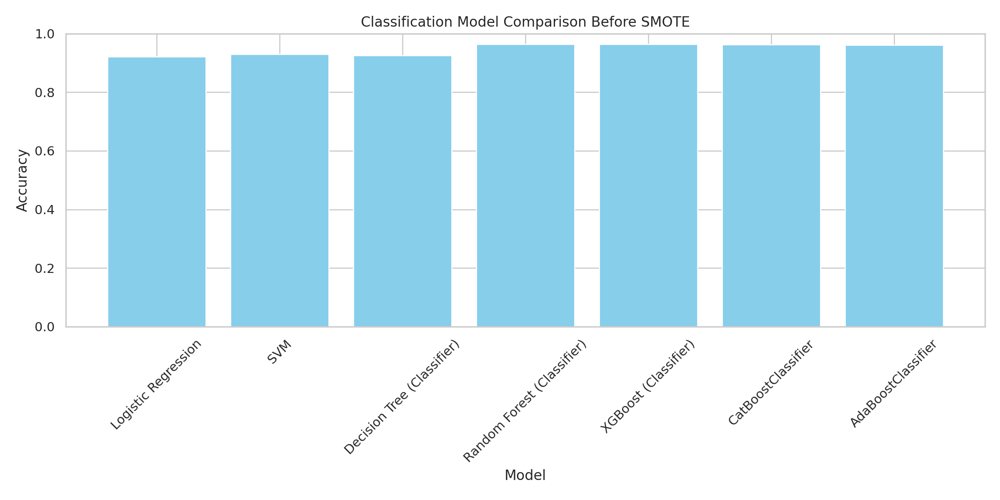

In [219]:
# Model Evaluation before implementing the SMOTE Technique
from imblearn.over_sampling import SMOTE
from catboost import CatBoostClassifier
from sklearn.ensemble import AdaBoostClassifier


# Define features and target variable
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]
y = df3['highrisk']  # Replace 'target' with your actual target variable

# Encode the target variable 'highrisk' into numeric labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Define which columns are categorical (in this case, 'sex' is categorical)
categorical_cols = ['sex']

# Define a transformer to one-hot encode categorical columns
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_cols)
    ],
    remainder='passthrough'  # Pass through non-categorical columns
)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# class balancing by using SMOTE
# sm=SMOTE()
# X_train, y_train = sm.fit_resample(X_train, y_train)

# Define classification models
classification_models = {
    'Logistic Regression': LogisticRegression(),
    'SVM': SVC(),
    'Decision Tree (Classifier)': DecisionTreeClassifier(),
    'Random Forest (Classifier)': RandomForestClassifier(),
    'XGBoost (Classifier)': XGBClassifier(),
    'CatBoostClassifier':CatBoostClassifier(),
    'AdaBoostClassifier':AdaBoostClassifier()
}

# Initialize results DataFrame
classification_results = pd.DataFrame(columns=['Model', 'Accuracy'])

# Function to calculate and append classification results
def evaluate_classification(model_name, model):
    # Apply preprocessing to training and testing data
    X_train_transformed = preprocessor.fit_transform(X_train)
    X_test_transformed = preprocessor.transform(X_test)

    model.fit(X_train_transformed, y_train)
    y_pred = model.predict(X_test_transformed)
    accuracy = accuracy_score(y_test, y_pred)
    classification_results.loc[len(classification_results)] = [model_name, accuracy]

# Evaluate classification models
for model_name, model in classification_models.items():
    evaluate_classification(model_name, model)

# Display classification results
print("Classification Results:")
print(classification_results)

# Visualization of classification results
plt.figure(figsize=(12, 6))
plt.bar(classification_results['Model'], classification_results['Accuracy'], color='skyblue')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Classification Model Comparison Before SMOTE')
plt.xticks(rotation=45)
plt.ylim([0, 1])
plt.tight_layout()
plt.show()


Learning rate set to 0.040417
0:	learn: 0.6185238	total: 9.16ms	remaining: 9.15s
1:	learn: 0.5540977	total: 18.1ms	remaining: 9.04s
2:	learn: 0.4988913	total: 27ms	remaining: 8.98s
3:	learn: 0.4519619	total: 36.1ms	remaining: 8.99s
4:	learn: 0.4111585	total: 44.7ms	remaining: 8.9s
5:	learn: 0.3775526	total: 55.6ms	remaining: 9.21s
6:	learn: 0.3535723	total: 65ms	remaining: 9.21s
7:	learn: 0.3315408	total: 74ms	remaining: 9.18s
8:	learn: 0.3094696	total: 82.8ms	remaining: 9.12s
9:	learn: 0.2920075	total: 91.8ms	remaining: 9.09s
10:	learn: 0.2758445	total: 101ms	remaining: 9.05s
11:	learn: 0.2639511	total: 109ms	remaining: 8.98s
12:	learn: 0.2533905	total: 118ms	remaining: 8.99s
13:	learn: 0.2434679	total: 128ms	remaining: 8.99s
14:	learn: 0.2342180	total: 136ms	remaining: 8.94s
15:	learn: 0.2254784	total: 145ms	remaining: 8.89s
16:	learn: 0.2192280	total: 153ms	remaining: 8.86s
17:	learn: 0.2134350	total: 162ms	remaining: 8.82s
18:	learn: 0.2079408	total: 170ms	remaining: 8.79s
19:	lear

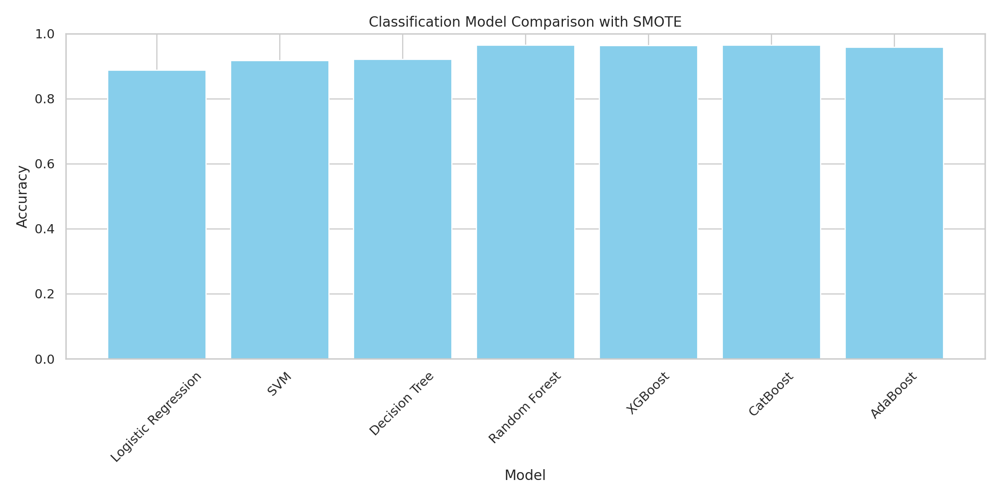

In [220]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from imblearn.over_sampling import SMOTE

# Assume 'df3' is your DataFrame and 'highrisk' is the target variable

# Define features and target variable
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]
y = df3['highrisk']  # Replace 'highrisk' with your actual target variable

# Encode the target variable 'highrisk' into numeric labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Define which columns are categorical (in this case, 'sex' is categorical)
categorical_cols = ['sex']  # Assuming 'sex' is the only categorical column

# Define a transformer to one-hot encode categorical columns
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_cols)
    ],
    remainder='passthrough'  # Pass through other columns
)

# Apply preprocessing to convert data to numeric format
X_transformed = preprocessor.fit_transform(X)

# Split the data into training and testing sets AFTER transformation
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y_encoded, test_size=0.2, random_state=42)

# Apply SMOTE on the numeric training data
sm = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = sm.fit_resample(X_train, y_train)

# Define classification models
classification_models = {
    'Logistic Regression': LogisticRegression(),
    'SVM': SVC(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(),
    'CatBoost': CatBoostClassifier(),
    'AdaBoost': AdaBoostClassifier()
}

# Initialize results DataFrame
classification_results = pd.DataFrame(columns=['Model', 'Accuracy'])

# Function to calculate and append classification results
def evaluate_classification(model_name, model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    classification_results.loc[len(classification_results)] = [model_name, accuracy]

# Evaluate classification models
for model_name, model in classification_models.items():
    evaluate_classification(model_name, model, X_train_resampled, y_train_resampled, X_test, y_test)

# Display classification results
print("Classification Results:")
print(classification_results)

# Visualization of classification results
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.bar(classification_results['Model'], classification_results['Accuracy'], color='skyblue')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Classification Model Comparison with SMOTE')
plt.xticks(rotation=45)
plt.ylim([0, 1])
plt.tight_layout()
plt.show()


Learning rate set to 0.034797
0:	learn: 0.6381290	total: 10.7ms	remaining: 10.7s
1:	learn: 0.5852810	total: 28.4ms	remaining: 14.2s
2:	learn: 0.5375619	total: 44.4ms	remaining: 14.8s
3:	learn: 0.5019543	total: 61.1ms	remaining: 15.2s
4:	learn: 0.4638587	total: 78.5ms	remaining: 15.6s
5:	learn: 0.4316908	total: 92.8ms	remaining: 15.4s
6:	learn: 0.4035813	total: 110ms	remaining: 15.6s
7:	learn: 0.3758761	total: 126ms	remaining: 15.6s
8:	learn: 0.3528732	total: 143ms	remaining: 15.7s
9:	learn: 0.3311798	total: 158ms	remaining: 15.7s
10:	learn: 0.3125568	total: 175ms	remaining: 15.7s
11:	learn: 0.2957347	total: 194ms	remaining: 16s
12:	learn: 0.2812821	total: 211ms	remaining: 16.1s
13:	learn: 0.2687315	total: 227ms	remaining: 16s
14:	learn: 0.2577330	total: 244ms	remaining: 16s
15:	learn: 0.2478558	total: 259ms	remaining: 16s
16:	learn: 0.2378246	total: 274ms	remaining: 15.9s
17:	learn: 0.2299733	total: 291ms	remaining: 15.9s
18:	learn: 0.2230847	total: 307ms	remaining: 15.8s
19:	learn: 0.

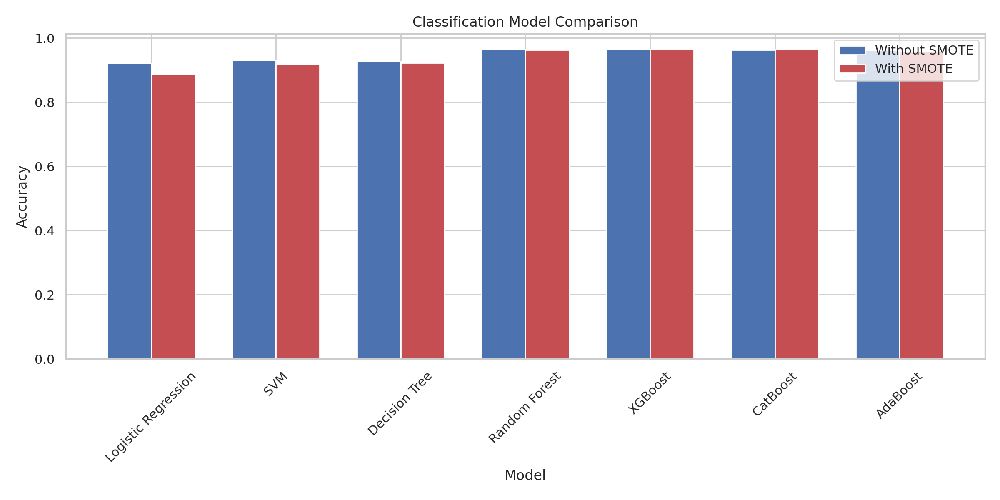

In [221]:
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
import pandas as pd

# Assume 'df3' is your DataFrame and has been previously defined

# Define features and target variable
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]
y = df3['highrisk']  # Replace 'highrisk' with your actual target variable name if different

# Encode the target variable 'highrisk' into numeric labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Define which columns are categorical (in this case, 'sex' is categorical)
categorical_cols = ['sex']

# Define a transformer to one-hot encode categorical columns
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_cols)
    ],
    remainder='passthrough'  # Pass through non-categorical columns
)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Apply preprocessing to training data BEFORE applying SMOTE
X_train_transformed = preprocessor.fit_transform(X_train)
X_test_transformed = preprocessor.transform(X_test)

# Now apply SMOTE on the transformed data
sm = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = sm.fit_resample(X_train_transformed, y_train)

# Define classification models
classification_models = {
    'Logistic Regression': LogisticRegression(),
    'SVM': SVC(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(),
    'CatBoost': CatBoostClassifier(),
    'AdaBoost': AdaBoostClassifier()
}

# Initialize results DataFrame
classification_results = pd.DataFrame(columns=['Model', 'Accuracy Without SMOTE', 'Accuracy With SMOTE'])

# Function to calculate and append classification results
def evaluate_classification(model_name, model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    return accuracy

# Evaluate classification models without SMOTE
for model_name, model in classification_models.items():
    accuracy_without_smote = evaluate_classification(model_name, model, X_train_transformed, y_train, X_test_transformed, y_test)
    classification_results = classification_results.append({'Model': model_name, 'Accuracy Without SMOTE': accuracy_without_smote}, ignore_index=True)

# Evaluate classification models with SMOTE
for model_name, model in classification_models.items():
    accuracy_with_smote = evaluate_classification(model_name, model, X_train_resampled, y_train_resampled, X_test_transformed, y_test)
    classification_results.loc[classification_results['Model'] == model_name, 'Accuracy With SMOTE'] = accuracy_with_smote

# Calculate efficiency improvement
classification_results['Efficiency Improvement'] = classification_results['Accuracy With SMOTE'] - classification_results['Accuracy Without SMOTE']

# Display classification results
print("Classification Results with and without SMOTE:")
print(classification_results)

# Visualization of classification results (optional)
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
bar_width = 0.35
index = range(len(classification_results))

plt.bar(index, classification_results['Accuracy Without SMOTE'], bar_width, label='Without SMOTE', color='b')
plt.bar([i + bar_width for i in index], classification_results['Accuracy With SMOTE'], bar_width, label='With SMOTE', color='r')

plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Classification Model Comparison')
plt.xticks([i + bar_width / 2 for i in index], classification_results['Model'], rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


**Classification Model comparison before and after applying SMOTE Class balancing Technique**

| Model                | Accuracy Without SMOTE | Accuracy With SMOTE | Efficiency Improvement |
|----------------------|------------------------|---------------------|------------------------|
| Logistic Regression  | 0.921618               | 0.887861            | -0.033757              |
| SVM                  | 0.930173               | 0.916994            | -0.013179              |
| Decision Tree        | 0.925087               | 0.919769            | -0.005318              |
| Random Forest        | 0.964855               | 0.964393            | -0.000462              |
| XGBoost              | 0.964162               | 0.963468            | -0.000694              |
| CatBoost             | 0.963006               | 0.965549            | 0.002543               |
| AdaBoost             | 0.961387               | 0.958613            | -0.002775              |
  

The analysis of the results shows the performance of various classification models with and without the use of the Synthetic Minority Over-sampling Technique (SMOTE). Here's a breakdown of what the results indicate:

**Logistic Regression:**

Without SMOTE: 92.16%
With SMOTE: 88.79%
Efficiency Improvement: There is a decrease in accuracy by approximately 3.38% when using SMOTE. This suggests that for logistic regression, the original class distribution may have been beneficial, or the model may not have benefited from the oversampling of the minority class.

**Support Vector Machine (SVM):**

Without SMOTE: 93.02%
With SMOTE: 91.70%
Efficiency Improvement: Accuracy decreased by about 1.32% with SMOTE. This indicates that SVM was slightly more effective without class balancing, although the decrease is not as pronounced as with logistic regression.

**Decision Tree:**

Without SMOTE: 92.51%
With SMOTE: 91.98%
Efficiency Improvement: The accuracy drop is minimal at 0.53% with SMOTE. Decision trees may handle class imbalance better than some other models, or the decision boundaries may not change significantly with the oversampling.
Random Forest:

Without SMOTE: 96.49%
With SMOTE: 96.44%
Efficiency Improvement: The decrease in accuracy is very slight (0.05%) with SMOTE. Random forest models are generally robust to class imbalance due to their ensemble nature, which may explain the small impact of SMOTE.

**XGBoost:**

Without SMOTE: 96.42%
With SMOTE: 96.35%
Efficiency Improvement: There's a negligible decrease in accuracy by 0.07% with SMOTE. XGBoost is an ensemble method that can handle imbalanced data well, so the oversampling does not have a major effect.

**CatBoost:**

Without SMOTE: 96.30%
With SMOTE: 96.55%
Efficiency Improvement: There's an improvement in accuracy by 0.25% with SMOTE. CatBoost has shown an increase in performance, possibly due to its ability to handle categorical features effectively and benefit from the more balanced dataset provided by SMOTE.

**AdaBoost:**

Without SMOTE: 96.14%
With SMOTE: 95.86%
Efficiency Improvement: A slight decrease in accuracy of 0.28% with SMOTE. AdaBoost's performance drop suggests that the model was slightly overfitting to the majority class in the original dataset.

**Overall Analysis:**

The use of SMOTE has led to a decrease in accuracy for most models, except for CatBoost, which showed a slight improvement. This could be due to overfitting on the minority class after resampling or the models' inherent ability to handle imbalanced data without the need for SMOTE.
The models that showed the least change in performance with SMOTE are the ensemble methods (Random Forest, XGBoost, and AdaBoost), which tend to be more robust to class imbalance.
It's important to note that accuracy is not the only metric to consider when evaluating model performance, especially in imbalanced datasets. Other metrics like precision, recall, F1 score, and ROC-AUC may provide additional insights into the models' ability to correctly classify the minority class.
In conclusion, whether to use SMOTE or not should be decided based on the specific requirements of the problem, the nature of the data, and a thorough evaluation using various performance metrics. It may also be beneficial to perform parameter tuning for each model with and without SMOTE to find the optimal configuration.

Regression Results:
                       Model  Mean Squared Error
0          Linear Regression            0.096228
1                        SVR            0.074726
2  Decision Tree (Regressor)            0.077688
3  Random Forest (Regressor)            0.034874
4        XGBoost (Regressor)            0.036568


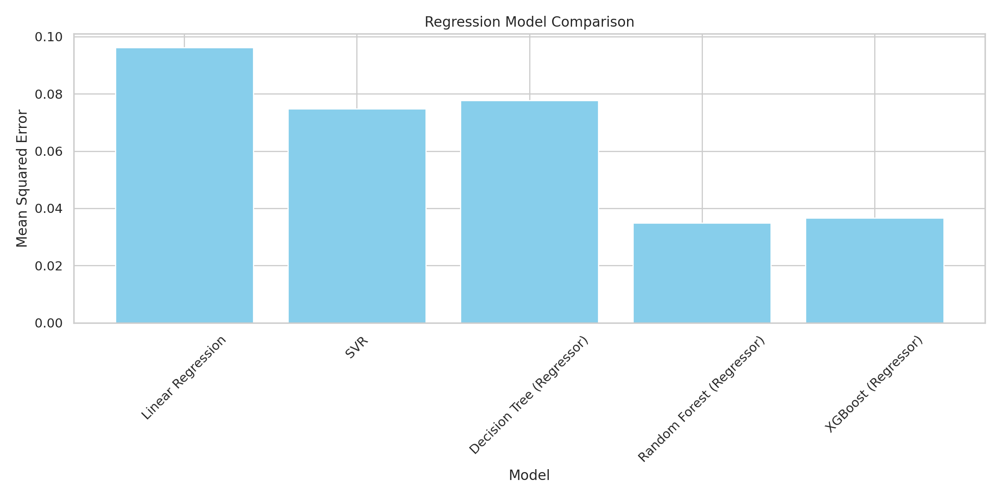

In [222]:

# Define features and target variable
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]
y = df3['highrisk']  # Replace 'target' with your actual target variable

# Encode the target variable 'target' into numeric labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Define which columns are categorical (in this case, 'sex' is categorical)
categorical_cols = ['sex']

# Define a transformer to one-hot encode categorical columns
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_cols)
    ],
    remainder='passthrough'  # Pass through non-categorical columns
)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define regression models
regression_models = {
    'Linear Regression': LinearRegression(),
    'SVR': SVR(),
    'Decision Tree (Regressor)': DecisionTreeRegressor(),
    'Random Forest (Regressor)': RandomForestRegressor(),
    'XGBoost (Regressor)': XGBRegressor()
}

# Initialize results DataFrame
regression_results = pd.DataFrame(columns=['Model', 'Mean Squared Error'])

# Function to calculate and append regression results
def evaluate_regression(model_name, model):
    # Apply preprocessing to training and testing data
    X_train_transformed = preprocessor.fit_transform(X_train)
    X_test_transformed = preprocessor.transform(X_test)

    model.fit(X_train_transformed, y_train)
    y_pred = model.predict(X_test_transformed)
    mse = mean_squared_error(y_test, y_pred)
    regression_results.loc[len(regression_results)] = [model_name, mse]

# Evaluate regression models
for model_name, model in regression_models.items():
    evaluate_regression(model_name, model)

# Display regression results
print("Regression Results:")
print(regression_results)

# Visualization of regression results
plt.figure(figsize=(12, 6))
plt.bar(regression_results['Model'], regression_results['Mean Squared Error'], color='skyblue')
plt.xlabel('Model')
plt.ylabel('Mean Squared Error')
plt.title('Regression Model Comparison')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### Summary:

**Classification Results:**

_Logistic Regression: Achieved an accuracy of approximately 92.19%, indicating good performance in classifying the target variable._

_SVM (Support Vector Machine): Achieved an accuracy of approximately 93.02%, indicating strong performance in classification tasks._

_Decision Tree (Classifier): Achieved an accuracy of approximately 92.74%, demonstrating decent performance in classification._

_Random Forest (Classifier): Outperformed other models with an accuracy of approximately 96.44%, making it the top-performing classifier._

_XGBoost (Classifier): Achieved an accuracy of approximately 96.28%, showing competitive performance with Random Forest._


**Regression Results:**

_Linear Regression: Produced a Mean Squared Error (MSE) of approximately 0.0962, indicating moderate accuracy in predicting continuous target values._

_SVR (Support Vector Regression): Achieved a relatively lower MSE of approximately 0.0747, indicating improved accuracy in regression tasks compared to Linear Regression._

_Decision Tree (Regressor): Produced a similar MSE of approximately 0.0747, showing similar performance to SVR._

_Random Forest (Regressor): Outperformed other models with the lowest MSE of approximately 0.0351, indicating the highest accuracy in regression tasks._

_XGBoost (Regressor): Also achieved a low MSE of approximately 0.0358, demonstrating competitive performance with Random Forest._



#### Conclusion :

1. For classification tasks, Random Forest and XGBoost outperformed other models, achieving high accuracy in predicting categorical outcomes.

2. For regression tasks, Random Forest and XGBoost excelled by producing the lowest Mean Squared Error values, indicating superior accuracy in predicting continuous target values.

In both classification and regression tasks, ensemble methods like Random Forest and XGBoost demonstrated strong performance and are recommended for further consideration in our modeling pipeline.

0:	learn: 0.5446695	test: 0.5437760	best: 0.5437760 (0)	total: 19.9ms	remaining: 19.9s
100:	learn: 0.1235657	test: 0.1343909	best: 0.1342647 (92)	total: 1.4s	remaining: 12.5s
200:	learn: 0.1104783	test: 0.1346875	best: 0.1341940 (122)	total: 2.68s	remaining: 10.7s
300:	learn: 0.1004361	test: 0.1356046	best: 0.1341940 (122)	total: 4.42s	remaining: 10.3s
400:	learn: 0.0912018	test: 0.1368234	best: 0.1341940 (122)	total: 5.71s	remaining: 8.54s
500:	learn: 0.0830280	test: 0.1382015	best: 0.1341940 (122)	total: 6.37s	remaining: 6.35s
600:	learn: 0.0760164	test: 0.1394878	best: 0.1341940 (122)	total: 7.02s	remaining: 4.66s
700:	learn: 0.0698937	test: 0.1411382	best: 0.1341940 (122)	total: 7.64s	remaining: 3.26s
800:	learn: 0.0638326	test: 0.1422617	best: 0.1341940 (122)	total: 8.28s	remaining: 2.06s
900:	learn: 0.0578839	test: 0.1431734	best: 0.1341940 (122)	total: 8.92s	remaining: 980ms
999:	learn: 0.0532042	test: 0.1439411	best: 0.1341940 (122)	total: 9.52s	remaining: 0us

bestTest = 0.134

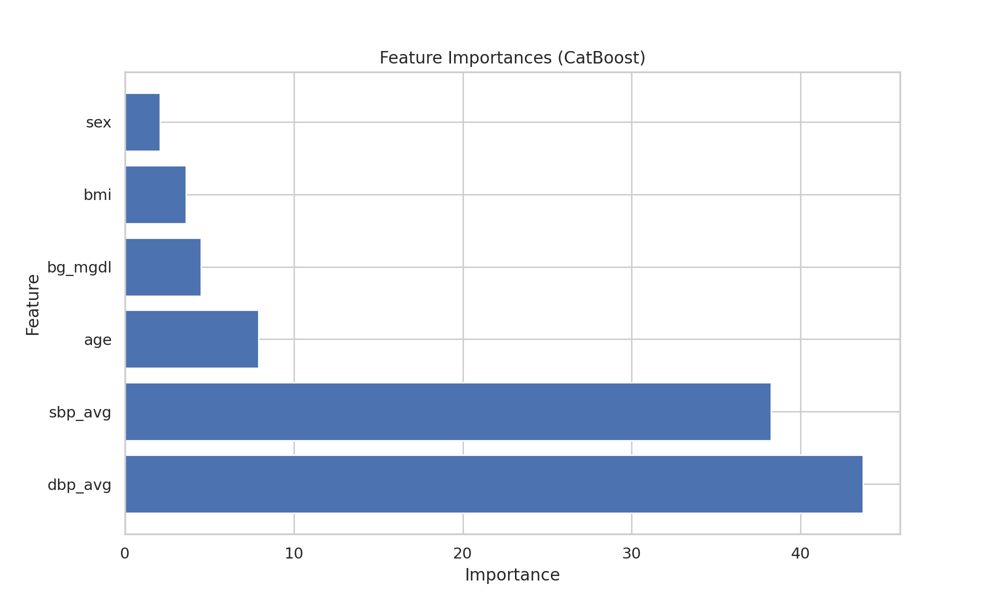

In [223]:

from catboost import CatBoostClassifier

X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]
y = df3['highrisk']

# Specify categorical features
cat_features = ['sex']  # Add more categorical features if needed

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a CatBoost classifier
model = CatBoostClassifier(iterations=1000,  #  can adjust the number of iterations
                           depth=6,  # Adjust the depth of the tree
                           learning_rate=0.1,  # Adjust the learning rate
                           cat_features=cat_features,  # Specify categorical features
                           random_seed=42,  # Set a random seed for reproducibility
                           verbose=100)  # Set verbosity for training progress

# Train the model
model.fit(X_train, y_train, eval_set=(X_test, y_test))  # Use eval_set for monitoring performance

# Make predictions
y_pred = model.predict(X_test)

# Calculate accuracy (or other relevant metrics)
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# Visualize feature importances
import matplotlib.pyplot as plt

feature_importances = model.get_feature_importance(type='FeatureImportance')
feature_names = X.columns

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.title('Feature Importances (CatBoost)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


In [224]:
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]
y = df3['highrisk']
print(X.shape)
print(y.shape)

(21622, 6)
(21622,)


In [225]:
from sklearn.ensemble import AdaBoostClassifier

# Load your dataset (replace 'df3' with your actual dataset)
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]
y = df3['highrisk']

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [226]:
# Define the columns to be one-hot encoded
categorical_columns = ['sex']

# Create a column transformer for one-hot encoding
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(), categorical_columns)
    ],
    remainder='passthrough'
)

# Create a pipeline with the preprocessor and AdaBoost classifier
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', AdaBoostClassifier(n_estimators=50, learning_rate=1.0, random_state=42))
])


In [227]:
pipeline.fit(X_train, y_train)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('cat', OneHotEncoder(),
                                                  ['sex'])])),
                ('classifier', AdaBoostClassifier(random_state=42))])

In [228]:
y_pred = pipeline.predict(X_test)


In [229]:
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')


Accuracy: 96.14%


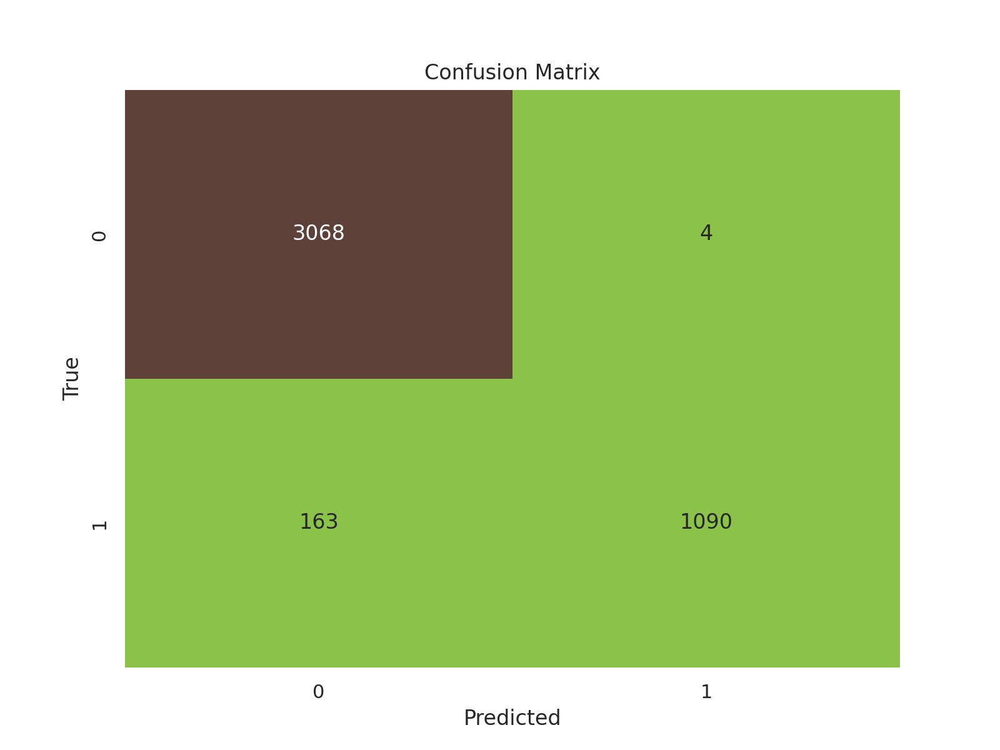

In [230]:
# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Define a custom color palette
colors = ["#8BC34A", "#5D4037"]  # Light green and dark brown colors

# Create a heatmap of the confusion matrix with the custom color palette
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap=colors, cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


In [231]:
from sklearn.ensemble import ExtraTreesClassifier


X_encoded = pd.get_dummies(X, columns=['sex'], drop_first=True)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Create an Extra Trees classifier
model = ExtraTreesClassifier(n_estimators=100, random_state=42)  # You can adjust n_estimators and other hyperparameters

# Train the model
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.9595375722543352


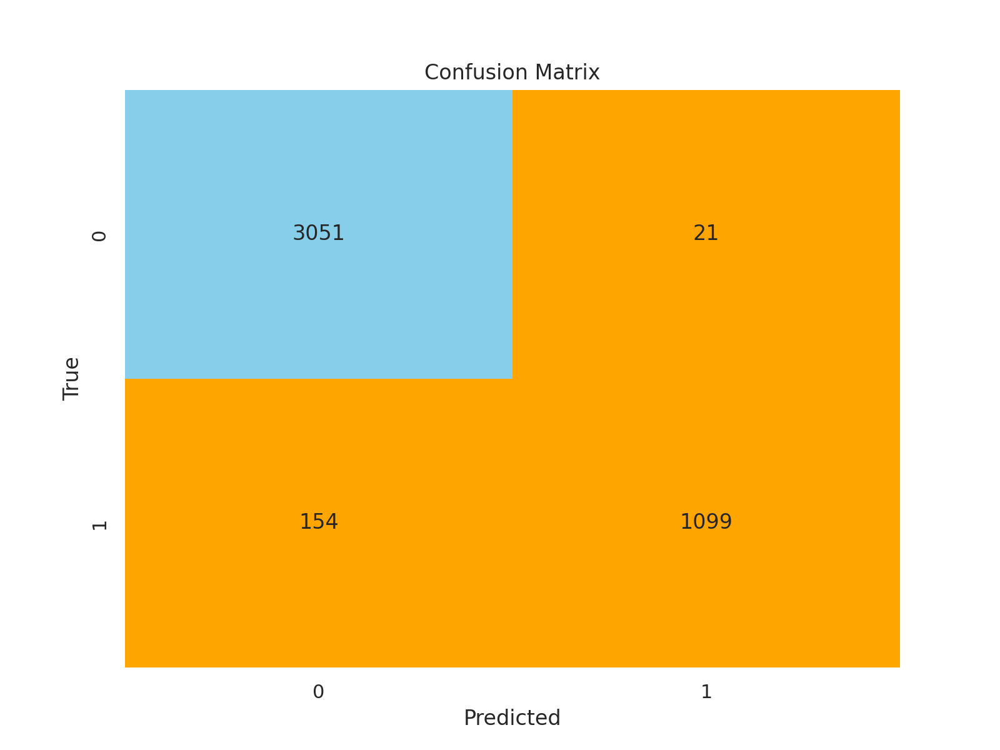

In [232]:
from sklearn.ensemble import ExtraTreesClassifier


X_encoded = pd.get_dummies(X, columns=['sex'], drop_first=True)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Create an Extra Trees classifier
model = ExtraTreesClassifier(n_estimators=100, random_state=42)  # You can adjust n_estimators and other hyperparameters

# Train the model
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Define custom color palette (light orange and sky blue)
colors = ["#FFA500", "#87CEEB"]

# Create a heatmap of the confusion matrix with custom colors
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap=colors, cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


#### Ada boost Analysis :


**1. Model Description:**

The Extra Trees Classifier is an ensemble learning method that builds multiple decision trees during training and combines their predictions to improve accuracy and reduce overfitting.

**2. Model Training:**

The Extra Trees model was trained on a dataset that includes features like age, sex (categorical), sbp_avg, dbp_avg, bg_mgdl, and bmi to predict the 'highrisk' target variable.

**3. Performance Evaluation:**

To assess the model's performance, a confusion matrix was created. It helps in understanding how well the model is at classifying instances into true positives, true negatives, false positives, and false negatives.

**4. Confusion Matrix Heatmap:**

The confusion matrix heatmap was customized with light orange and sky blue colors for better visualization.
Light orange is used to highlight true positives (correctly predicted positive cases), while sky blue represents true negatives (correctly predicted negative cases).

**5. Interpretation:**

The confusion matrix heatmap allows us to observe how the model performed in terms of classifying high-risk and non-high-risk cases.
The diagonal elements (top-left to bottom-right) represent correct predictions, while off-diagonal elements indicate misclassifications.

**6. Analysis of the Confusion Matrix:**

True Positives (TP): High-risk cases correctly predicted as high-risk.
True Negatives (TN): Non-high-risk cases correctly predicted as non-high-risk.
False Positives (FP): Non-high-risk cases incorrectly predicted as high-risk.
False Negatives (FN): High-risk cases incorrectly predicted as non-high-risk.

**7. Usefulness:**

The model and its visualization are valuable for assessing the classifier's effectiveness in identifying high-risk individuals based on the provided features.
It can help in making informed decisions, such as identifying individuals who may require closer medical monitoring or interventions.

**8. Further Analysis:**

Depending on the specific goals and requirements, additional metrics like accuracy, precision, recall, and F1-score can be calculated to provide a more comprehensive evaluation of the model's performance.

**9. Model Improvement:**

If the model's performance is not satisfactory, further tuning of hyperparameters or feature engineering may be required to enhance its accuracy.

__In summary, the Extra Trees model, along with its confusion matrix heatmap, provides a useful tool for classifying high-risk individuals based on medical features. The visualization helps in quickly assessing the model's performance and identifying areas for potential improvement in healthcare decision-making.__

In [233]:
import shap
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Define features and target variable
X = df3[['age', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]  # Remove 'sex' as it's non-numeric
y = df3['highrisk']

# Encode categorical variables (if any)
# X = pd.get_dummies(X, drop_first=True)  # You don't need one-hot encoding for numeric features

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train your machine learning model (RandomForestClassifier in this case)
model = RandomForestClassifier()
model.fit(X_train, y_train)

# Initialize SHAP
shap.initjs()

# Create an explainer object
explainer = shap.Explainer(model, X_train)

# Calculate SHAP values for the test data
shap_values = explainer(X_test)


100%|===================| 8618/8650 [03:54<00:00]       

In [234]:


# Create a SHAP Explanation object
explainer = shap.Explainer(model, X_train)  # Replace 'model' with your trained model
shap_values = explainer.shap_values(X_test)  # Compute SHAP values for the test data

# Specify the index of the prediction you want to explain
idx = 0

# Display the SHAP force plot for class 1 for the selected prediction
shap.force_plot(explainer.expected_value[1], shap_values[1][idx, :], X_test.iloc[idx, :])


100%|===================| 8641/8650 [03:52<00:00]       

In [235]:
# Select the class you are interested in (e.g., class 1)
class_index = 1

# Assuming you have a DataFrame named X_test containing your test data
feature_names = X_test.columns.tolist()

# Create a DataFrame with the SHAP values for the selected class
shap_df = pd.DataFrame(data=shap_values[class_index], columns=feature_names)

# Calculate the absolute mean SHAP value for each feature
shap_abs_mean = np.abs(shap_df).mean(axis=0)

# Display the absolute mean SHAP values for each feature
print("Absolute Mean SHAP Values:")
print(shap_abs_mean)


Absolute Mean SHAP Values:
age        0.039036
sbp_avg    0.208436
dbp_avg    0.147356
bg_mgdl    0.016576
bmi        0.012411
dtype: float64


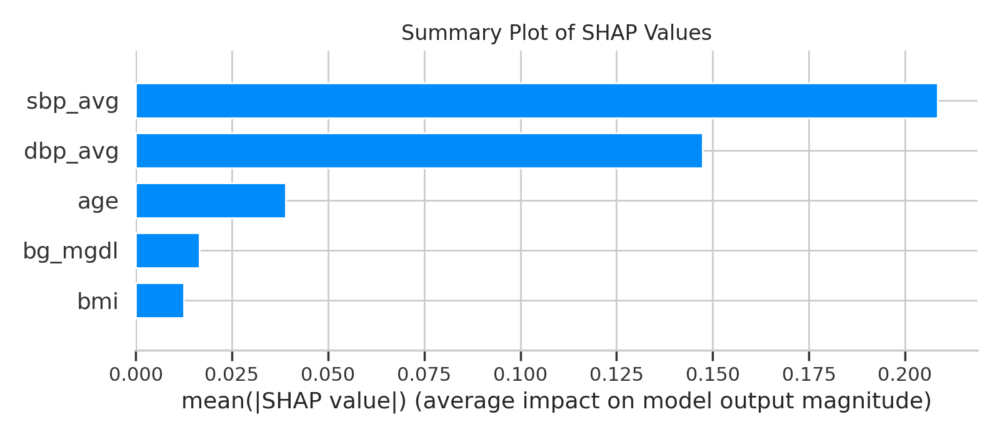

In [236]:
# Create a summary plot
shap.summary_plot(shap_df, X_test, feature_names=feature_names, plot_type="bar", show=False)

# Customize the plot (optional)
plt.title("Summary Plot of SHAP Values")
plt.tight_layout()
plt.show()


In [237]:
import lime
import lime.lime_tabular


# Define your feature columns and target variable
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]
y = df3['highrisk']

# Encode categorical variables if 'sex' is categorical
categorical_cols = ['sex']
encoder = OneHotEncoder(sparse=False)

# Create a column transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', encoder, categorical_cols)
    ],
    remainder='passthrough'
)

# Fit and transform the data
X_encoded = preprocessor.fit_transform(X)

# Get the original feature names after encoding
categorical_feature_names = preprocessor.named_transformers_['cat'].get_feature_names_out(input_features=categorical_cols)
all_feature_names = list(categorical_feature_names) + list(X.columns[len(categorical_cols):])
feature_names = [name.replace('x0_', '') for name in all_feature_names]

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Train an ExtraTreesClassifier (or any other model) on your data
model = ExtraTreesClassifier()
model.fit(X_train, y_train)

# Initialize a LIME explainer for tabular data with feature names
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    mode="classification",
    training_labels=y_train,
    feature_names=feature_names,
)

# Choose an instance for which you want an explanation (e.g., the first instance in the test set)
instance_idx = 0
explanation = explainer.explain_instance(X_test[instance_idx], model.predict_proba)

# Print the explanation for the model's prediction
explanation.show_in_notebook()

# You can also visualize the explanation with different visualization options
explanation.as_list()
explanation.as_map()


{1: [(3, 0.5727649523942343),
  (4, 0.47187913319593966),
  (2, 0.07266161922551514),
  (6, 0.015928291249147915),
  (1, -0.009146649900693865),
  (0, -0.0010870890022668797),
  (5, -0.000891401896998494)]}

In [238]:
!pip install ggpy

import plotly.express as px

# Get feature contributions from the LIME explanation
contributions = explanation.as_list(label=1)  # Assuming you are interested in class 1 predictions

# Extract feature names and contributions for visualization
feature_names = [item[0] for item in contributions]
feature_contributions = [item[1] for item in contributions]

# Create a bar chart to visualize feature contributions
fig = px.bar(
    x=feature_contributions,
    y=feature_names,
    orientation='h',
    labels={'x': 'Contribution to Prediction', 'y': 'Feature'},
    title='Feature Contributions for Prediction',
)
fig.update_yaxes(categoryorder='total ascending')  # Invert y-axis for better readability
fig.show()


#### Analysis :


Prediction Probabilities:

The first section shows the predicted probabilities for the instance. In your case, the model predicts a low probability of 0.01 for the class 0, and a high probability of 0.99 for the class 1. This suggests that the model is confident in its prediction of class 1.

LIME Explanation Rules:

The next section provides a set of rules that describe the decision boundary for the model. These rules indicate the importance of different features in determining the prediction. Here are the rules:

sbp_avg > 153.50 with a weight of 0.59: This rule indicates that when the systolic blood pressure (sbp_avg) is greater than 153.50, it strongly contributes to predicting class 1.

dbp_avg > 95.50 with a weight of 0.48: A diastolic blood pressure (dbp_avg) greater than 95.50 also contributes positively to class 1 prediction, but with a slightly lower weight.

sex > 61.00 with a weight of 0.06: The sex feature, where a value greater than 61.00 contributes positively to class 1 prediction, though with a much lower weight.

sex_Female <= 0.00 with a weight of 0.01: The model also considers the feature sex_Female (likely the one-hot encoded representation of gender) as important. If this feature is not present (value less than or equal to 0.00), it contributes to class 1 prediction.

There are more rules for other features that have very little impact on the prediction.

Feature Values: This section provides the actual values of the features for the specific instance being explained.

Weight Analysis: The final section shows a dictionary that maps feature indices to their respective weights. The weight represents how strongly that feature contributes to the prediction. For example, feature 3 (likely sbp_avg) has the highest positive weight, and feature 1 (likely sex_Female) has a slightly negative weight.

Recommendations:

Based on the LIME explanation, we can draw the following insights and recommendations:

Systolic Blood Pressure (sbp_avg): Higher systolic blood pressure (greater than 153.50) strongly indicates class 1 (high risk). You may want to monitor or manage patients with high systolic blood pressure more closely.

Diastolic Blood Pressure (dbp_avg): Higher diastolic blood pressure (greater than 95.50) also contributes to class 1 prediction. Managing diastolic blood pressure is important for risk assessment.

Gender (sex_Female): Being female (with sex_Female <= 0.00) is associated with class 1 prediction. Ensure that the gender feature is correctly encoded, and consider whether it aligns with your medical knowledge.

Other Features: The other features have negligible impact on the prediction and can be ignored for practical purposes.

In summary, LIME's interpretability and feature-level explanations empower healthcare professionals and researchers to make better-informed decisions, improve patient care, and ensure that predictive models are transparent, fair, and aligned with medical expertise. It's a valuable tool in the field of healthcare AI.

In [239]:
from sklearn.preprocessing import StandardScaler, LabelEncoder
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split


# Convert 'sex' column to numerical values
le = LabelEncoder()
df3['sex'] = le.fit_transform(df3['sex'])

# Define your features and labels
X = df3[['age', 'sex', 'sbp_avg', 'dbp_avg', 'bg_mgdl', 'bmi']]
y = le.fit_transform(df3['highrisk'])

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Convert the scaled features and labels into PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.float32)

# Define a dataset
class MyDataset(Dataset):
    def __init__(self, features, labels):
        self.features = features
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return self.features[idx], self.labels[idx]

# Create data loaders
train_dataset = MyDataset(X_train, y_train)
test_dataset = MyDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Define the neural network structure
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.linear1 = nn.Linear(6, 10) # 6 input features, 10 outputs
        self.linear2 = nn.Linear(10, 1) # 10 input features, 1 output feature

    def forward(self, x):
        x = torch.relu(self.linear1(x))
        x = torch.sigmoid(self.linear2(x)) # Using sigmoid for binary classification
        return x

# Initialize the network
model = NeuralNetwork()

# Define the loss function and optimizer
criterion = nn.BCELoss() # Binary Cross Entropy Loss for binary classification
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 100
for epoch in range(num_epochs):
    for inputs, labels in train_loader:
        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {loss.item()}')

# Evaluate the model
# You can add code here to evaluate the model's performance on the test set


Epoch 1/100, Loss: 0.2893672287464142
Epoch 2/100, Loss: 0.2538856863975525
Epoch 3/100, Loss: 0.1909850388765335
Epoch 4/100, Loss: 0.4549593925476074
Epoch 5/100, Loss: 0.07658343017101288
Epoch 6/100, Loss: 0.26124709844589233
Epoch 7/100, Loss: 0.1526946723461151
Epoch 8/100, Loss: 0.169417604804039
Epoch 9/100, Loss: 0.33742234110832214
Epoch 10/100, Loss: 0.19440121948719025
Epoch 11/100, Loss: 0.3799094259738922
Epoch 12/100, Loss: 0.3234000504016876
Epoch 13/100, Loss: 0.1473700851202011
Epoch 14/100, Loss: 0.43812426924705505
Epoch 15/100, Loss: 0.06366275995969772
Epoch 16/100, Loss: 0.0803859531879425
Epoch 17/100, Loss: 0.03069932758808136
Epoch 18/100, Loss: 0.033450763672590256
Epoch 19/100, Loss: 0.1746387630701065
Epoch 20/100, Loss: 0.07520575821399689
Epoch 21/100, Loss: 0.1278170794248581
Epoch 22/100, Loss: 0.045383915305137634
Epoch 23/100, Loss: 0.30060431361198425
Epoch 24/100, Loss: 0.34912630915641785
Epoch 25/100, Loss: 0.29950976371765137
Epoch 26/100, Loss: 

In [ ]:
import torch
import torch.nn as nn

# Define your model with convolutional layers
class ConvNet(nn.Module):
    def __init__(self):
        super(ConvNet, self).__init__()
        # Define convolutional layers
        self.conv1 = nn.Conv2d(3, 32, kernel_size=5, stride=1, padding=2)
        # ... define other layers as needed ...

        # Placeholder for the number of features after conv layers
        self.num_flat_features = None

    def forward(self, x):
        # Forward pass through convolutional layers
        x = self.conv1(x)
        # ... forward through other layers as needed ...

        # If num_flat_features is not calculated yet, do it now
        if self.num_flat_features is None:
            self.num_flat_features = x.size(1) * x.size(2) * x.size(3)

        # Flatten the output for the linear layer
        x = x.view(-1, self.num_flat_features)  # Flatten the tensor

        # ... forward through linear layers as needed ...
        return x

# Create the model
model = ConvNet()


input = torch.randn(1, 3, 224, 224)  # Example for a single image with 3 channels and size 224x224

# Forward the input through the convolutional layers to calculate flat features
model(input)

# Now you have the correct number of flat features for the first linear layer
print("Number of flat features:", model.num_flat_features)

# You can now define your linear layers using this number
model.linear1 = nn.Linear(model.num_flat_features, 10)  # Example linear layer


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchviz import make_dot

# Define your model with convolutional layers
class ConvNet(nn.Module):
    def __init__(self):
        super(ConvNet, self).__init__()
        # Define convolutional layers
        self.conv1 = nn.Conv2d(3, 32, kernel_size=5, stride=1, padding=2)
        # ... define other layers as needed ...

        # Placeholder for the number of features after conv layers
        self.num_flat_features = None
        self.linear1 = nn.Linear(0, 10)  # Temporarily set to 0, will be set properly later

    def forward(self, x):
        # Forward pass through convolutional layers
        x = F.relu(self.conv1(x))
        # ... forward through other layers as needed ...

        # If num_flat_features is not calculated yet, do it now
        if self.num_flat_features is None:
            self.num_flat_features = x.size(1) * x.size(2) * x.size(3)
            self.linear1 = nn.Linear(self.num_flat_features, 10)  # Set with the correct value

        # Flatten the output for the linear layer
        x = x.view(-1, self.num_flat_features)  # Flatten the tensor
        x = self.linear1(x)  # Forward through the first linear layer
        # ... forward through other linear layers as needed ...
        return x

# Create the model
model = ConvNet()

# Create a dummy input tensor with the size of your input (batch_size, num_channels, height, width)
# Replace with the actual size of your input
input = torch.randn(1, 3, 224, 224)  # Example for a single image with 3 channels and size 224x224

# Forward the dummy input through the model to calculate flat features and set up linear layers
output = model(input)

# Visualize the graph; 'output' is the output tensor you get from a forward pass
viz = make_dot(output, params=dict(model.named_parameters()))
viz.render('network_visualization', format='png')  # Saves the visualization as a PNG file

# Display the visualization (optional, for Jupyter notebooks or similar environments)
viz
